# Regression Kriging: Comparing Covariates (Estero Bay)

This document includes Python codes that compare regression kriging with 1) bathymatry, 2) LDI, 3) basymatry+ LDI.

All date are shared in the [box folder](https://usf.box.com/s/xu3dw4i1emv2hzveyf9idnx9q78t939c).

# Table of Contents:

* [1.Load Data](#load_data)
* [2. Combine Discrete and Continuous Data](#preprocess)
* [3. Estero Bay](#ch)
    * [3.1 Preview](#ch_preview)
    * [3.2 Dissolved Oxygen](#do)
        * [3.2.1 Regression Kriging (covariate: bathymetry](#do_bathy)
        * [3.2.2 Regression Kriging: (covariate: LDI)](#do_ldi)
        * [3.2.3 Regression Kriging: (covariate: PopDen)](#do_pd)
        * [3.2.4 Regression Kriging: (covariate: Water Flow)](#do_wf)
        * [3.2.5 Regression Kriging (covariate: bathymetry+LDI](#do_ldi_bathy)
        * [3.2.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#do_ldi_bathy_wf) 
        * [3.2.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#do_ldi_bathy_pd) 
        * [3.2.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#do_ldi_bathy_pd_wf) 
        * [3.2.9 Interpolation Validation](#do_val_sum)
    * [3.3 Salinity (insufficient data, incomplete)](#s)
        * [3.3.1 Regression Kriging (covariate: bathymetry](#s_bathy)
        * [3.3.2 Regression Kriging: (covariate: LDI)](#s_ldi)
        * [3.3.3 Regression Kriging (covariate: bathymetry+LDI](#s_ldi_bathy)
        * [3.3.3 Regression Kriging: (covariate: PopDen)](#s_pd)
        * [3.3.4 Regression Kriging: (covariate: Water Flow)](#s_wf)
        * [3.3.5 Regression Kriging (covariate: bathymetry+LDI](#s_ldi_bathy)
        * [3.3.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#s_ldi_bathy_wf) 
        * [3.3.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#s_ldi_bathy_pd) 
        * [3.3.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#s_ldi_bathy_pd_wf) 
        * [3.3.9 Interpolation Validation](#s_val_sum)
    * [3.4 Total Nitrogen](#tn)
        * [3.4.1 Regression Kriging (covariate: bathymetry](#tn_bathy)
        * [3.4.2 Regression Kriging: (covariate: LDI)](#tn_ldi)
        * [3.4.3 Regression Kriging (covariate: bathymetry+LDI](#tn_ldi_bathy)
        * [3.4.3 Regression Kriging: (covariate: PopDen)](#tn_pd)
        * [3.4.4 Regression Kriging: (covariate: Water Flow)](#tn_wf)
        * [3.4.5 Regression Kriging (covariate: bathymetry+LDI](#tn_ldi_bathy)
        * [3.4.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#tn_ldi_bathy_wf) 
        * [3.4.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#tn_ldi_bathy_pd) 
        * [3.4.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#tn_ldi_bathy_pd_wf) 
        * [3.4.9 Interpolation Validation](#tn_val_sum)
    * [3.5 Turbidity](#t)
        * [3.5.1 Regression Kriging (covariate: bathymetry](#t_bathy)
        * [3.5.2 Regression Kriging: (covariate: LDI)](#t_ldi)
        * [3.5.3 Regression Kriging (covariate: bathymetry+LDI](#t_ldi_bathy)
        * [3.5.3 Regression Kriging: (covariate: PopDen)](#t_pd)
        * [3.5.4 Regression Kriging: (covariate: Water Flow)](#t_wf)
        * [3.5.5 Regression Kriging (covariate: bathymetry+LDI](#t_ldi_bathy)
        * [3.5.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#t_ldi_bathy_wf) 
        * [3.5.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#t_ldi_bathy_pd) 
        * [3.5.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#t_ldi_bathy_pd_wf) 
        * [3.5.9 Interpolation Validation](#t_val_sum)
    * [3.6 Secchi Depth (insufficient data, incomplete)](#sd)
        * [3.6.1 Regression Kriging (covariate: bathymetry](#sd_bathy)
        * [3.6.2 Regression Kriging: (covariate: LDI)](#sd_ldi)
        * [3.6.3 Regression Kriging (covariate: bathymetry+LDI](#sd_ldi_bathy)
        * [3.6.3 Regression Kriging: (covariate: PopDen)](#sd_pd)
        * [3.6.4 Regression Kriging: (covariate: Water Flow)](#sd_wf)
        * [3.6.5 Regression Kriging (covariate: bathymetry+LDI](#sd_ldi_bathy)
        * [3.6.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#sd_ldi_bathy_wf) 
        * [3.6.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#sd_ldi_bathy_pd) 
        * [3.6.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#sd_ldi_bathy_pd_wf) 
        * [3.6.9 Interpolation Validation](#sd_val_sum)

In [18]:
import time, math, os, importlib
import sklearn.metrics  
import arcgisscripting
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio as rio
import rasterio.mask
import rasterio.plot as rio_pl
import matplotlib.image as mpimg

from rasterio.plot import show
from rasterio.transform import Affine
from rasterio.mask import mask
from rasterio import MemoryFile
from rasterio.profiles import DefaultGTiffProfile
from scipy.spatial import Voronoi, voronoi_plot_2d
from scipy.stats import sem
from sklearn.metrics import mean_squared_error
from shapely.geometry import box, Polygon, Point
from shapely import wkt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
import contextily as cx

import arcpy
from arcpy.sa import *
import sys
sys.path.append('..')
import misc.preprocess
import misc.interpolation
arcpy.env.overwriteOutput = True

# 1. Load and Preprocess Data <a class="anchor" id="load_data"></a>

In [19]:
path = "E:/Projects/SEACAR_WQ_Pilot/"
gis_path = path+'GIS_data/'

# path = "D:/Water_Quailty/"
# gis_path = path+'Test02200/'

Preprocess the data and save the preprocessed data in new files

In [20]:
# dfDis, dfCon = misc.preprocess.preprocess(path + r"OEAT_Discrete-2023-Jan-23.csv", 
#                     path + r"OEAT_Continuous_1-2023-Jan-23.csv",
#                     path + r"OEAT_Continuous_2-2023-Jan-23.csv")

# dfDis.to_csv(path + "discrete_0214.csv")
# dfCon.to_csv(path + "continuous_0214.csv")

To save time, we can load the preprocessed "discrete_0214.csv" and "continuous_0214.csv".

In [21]:
#dfDis = pd.read_csv("D:/Water_Quailty/Test0214/discrete_0214.csv")
#dfCon = pd.read_csv("D:/Water_Quailty/Test0214/continuous_0214.csv")

dfDis = pd.read_csv(path + "discrete_0214.csv")
dfCon = pd.read_csv(path + "continuous_0214.csv")

In [22]:
col_ls = ['RowID','ParameterName','ParameterUnits','ProgramLocationID','ActivityType','ManagedAreaName',
                   'SampleDate','Year','Month','ResultValue','ValueQualifier','Latitude_DD','Longitude_DD']
para_ls = ["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth"]
para_ls_ab = ["S","TN","DO","T","SD"]
# Convert full MA names to short names
dictArea    = {'Gasparilla Sound-Charlotte Harbor Aquatic Preserve':'Charlotte Harbor','Big Bend Seagrasses Aquatic Preserve':'Big Bend',
                'Guana Tolomato Matanzas National Estuarine Research Reserve':'GTM Reserve','Estero Bay Aquatic Preserve':'Estero Bay',
                'Biscayne Bay Aquatic Preserve':'Biscayne Bay','Matlacha Pass Aquatic Preserve':'Matlacha Pass AP',
                'Lemon Bay Aquatic Preserve':'Lemon Bay','Cape Haze Aquatic Preserve':'Cape Haze','Pine Island Sound Aquatic Preserve':'Pine Island'}

# Convert full MA names to MA name in ORCP_Managed_Areas_Oct2021
dictArea2    = {'Gasparilla Sound-Charlotte Harbor Aquatic Preserve':'Gasparilla Sound-Charlotte Harbor','Big Bend Seagrasses Aquatic Preserve':'Big Bend Seagrasses',
                'Guana Tolomato Matanzas National Estuarine Research Reserve':'Guana Tolomato Matanzas NERR','Estero Bay Aquatic Preserve':'Estero Bay',
                'Biscayne Bay Aquatic Preserve':'Biscayne Bay','Matlacha Pass Aquatic Preserve':'Matlacha Pass',
                'Lemon Bay Aquatic Preserve':'Lemon Bay','Cape Haze Aquatic Preserve':'Cape Haze','Pine Island Sound Aquatic Preserve':'Pine Island Sound'}

dictUnits   = {"Salinity":"ppt","Total Nitrogen": "mg/L","Dissolved Oxygen": "mg/L","Turbidity": "NTU", "Secchi Depth": "m"}
listArea    = dfCon["ManagedAreaName"].unique()
listPara    = ["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth"] 

# 2. Combine Discrete and Continuous Data <a class="anchor" id="combine"></a>

Combine dis and con dataframes

In [23]:
#Select managed area
Area = 'Estero Bay Aquatic Preserve'

# Set variables of the program
year = "2016"
Para = 'Dissolved Oxygen'
Para_ab = "DO"
SpatialRef = '3086'
b_name = 'eb'

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'
boundary_shp = gis_path+ '{}.shp'.format(b_name)

# ---------------------------- Uncomment in the first run --------------------------
dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\2681254868.py:25: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\2681254868.py:26: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Skip the preprocessing and load the pre-stored dataframes

In [24]:
# gdfDryAll = pd.read_csv(gis_path+'gdfDryAll{}.csv'.format(year))
# gdfDryAll = gdfDryAll['geometry'].apply(wkt.loads)
# gdfDryAll = gpd.GeoDataFrame(gdfDryAll, crs='epsg:'+SpatialRef)

# gdfWetAll = pd.read_csv(gis_path+'gdfWetAll{}.csv'.format(year))
# gdfWetAll = gdfWetAll['geometry'].apply(wkt.loads)
# gdfWetAll = gpd.GeoDataFrame(gdfWetAll, crs='epsg:'+SpatialRef)

# 3. Estero Bay <a class="anchor" id="ch"></a>
## 3.1 Preview Data <a class="anchor" id="ch_preview"></a>

In [25]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

ma_table = pd.read_csv(gis_path + "MA_table.csv")

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [26]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Estero Bay Aquatic Preserve')

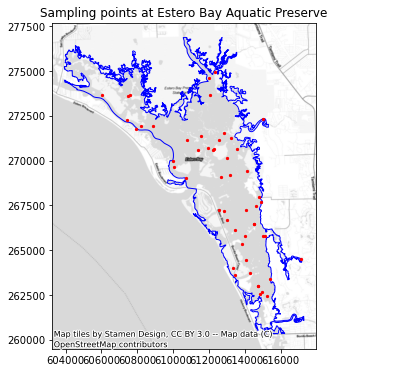

In [27]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

## 3.2 Dissolved Oxygen <a class="anchor" id="do"></a>

### 3.2.1 Regression Kriging (covariate: bathymetry) <a class="anchor" id="do_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

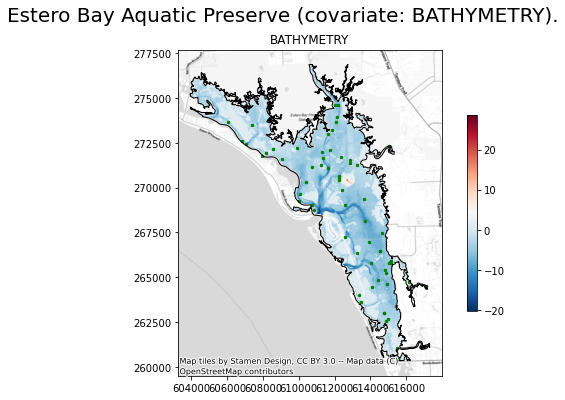

In [28]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate.upper(), ax, fig)

RK interpolation

In [29]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 59.982797622680664 seconds ---
Start the interpolation with the RK method
--- Time lapse: 48.26908206939697 seconds ---


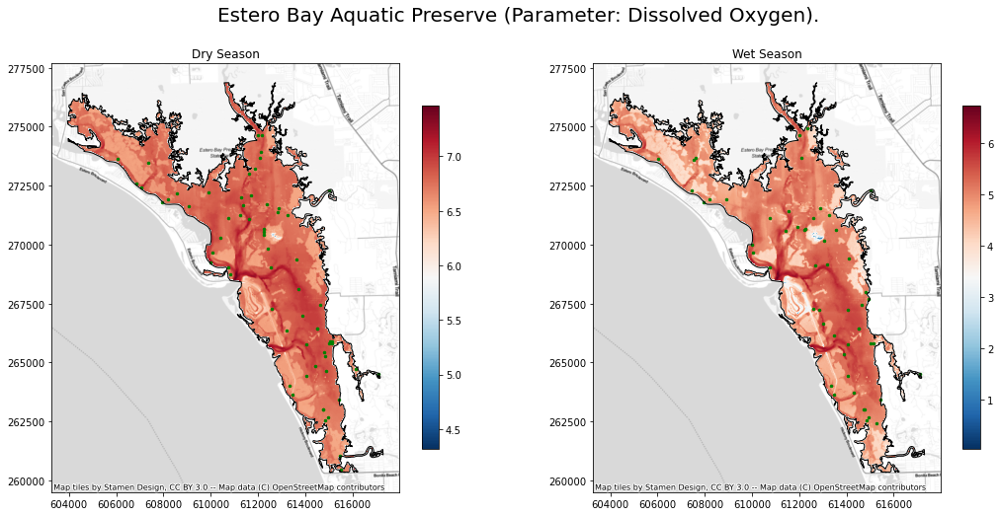

In [30]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.2.2 Regression Kriging (covariate: LDI) <a class="anchor" id="do_ldi"></a>


RK interpolation

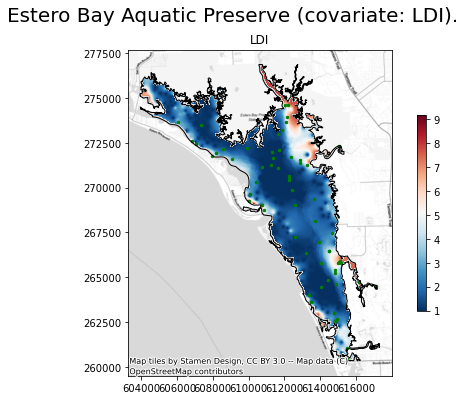

In [31]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [32]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 63.257561445236206 seconds ---
Start the interpolation with the RK method
--- Time lapse: 52.95057940483093 seconds ---


Plot the interpolation result

C:\Users\qiangy\AppData\Local\ESRI\conda\envs\geo3\lib\site-packages\matplotlib\image.py:487: RuntimeWarning: overflow encountered in true_divide
  A_scaled /= ((a_max - a_min) / frac)


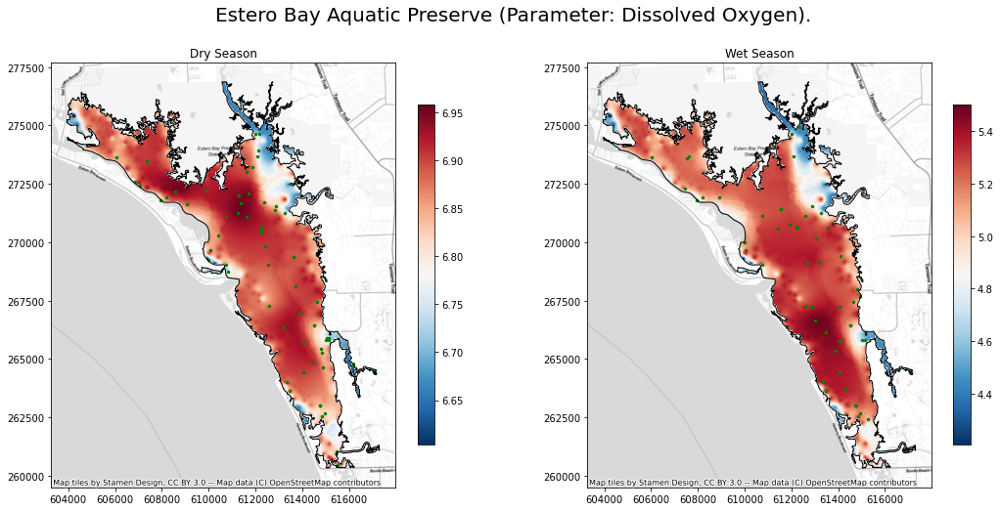

In [33]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.2.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="do_pd"></a>


RK interpolation

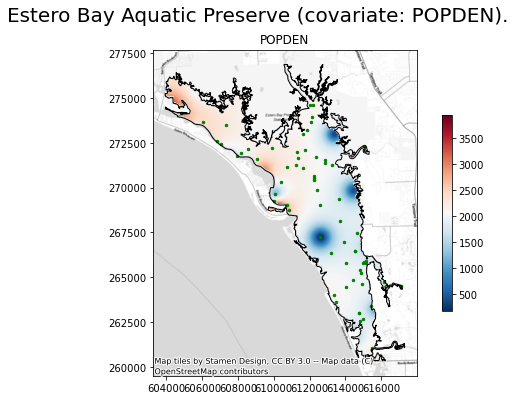

In [34]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [35]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 55.930625915527344 seconds ---
Start the interpolation with the RK method
--- Time lapse: 50.432305097579956 seconds ---


Plot the interpolation result

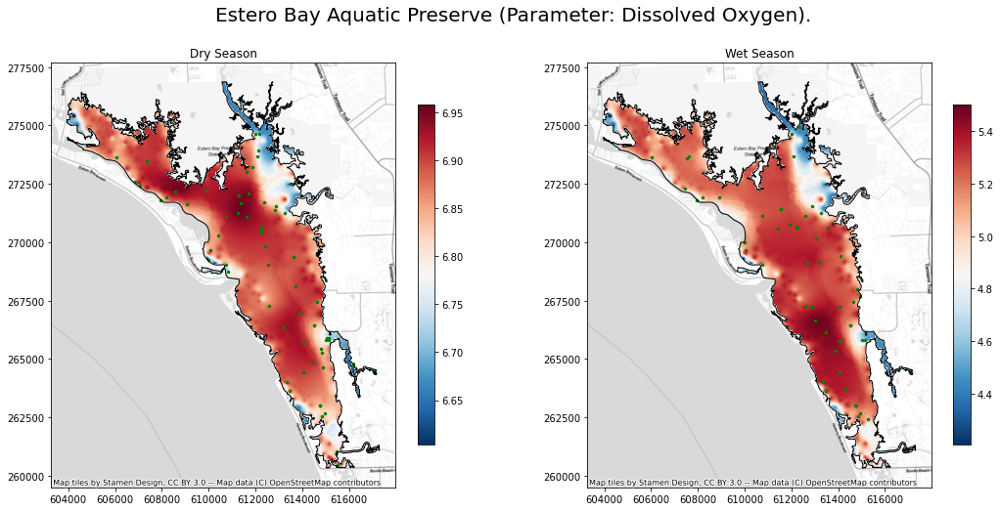

In [36]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.2.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="do_wf"></a>

RK interpolation

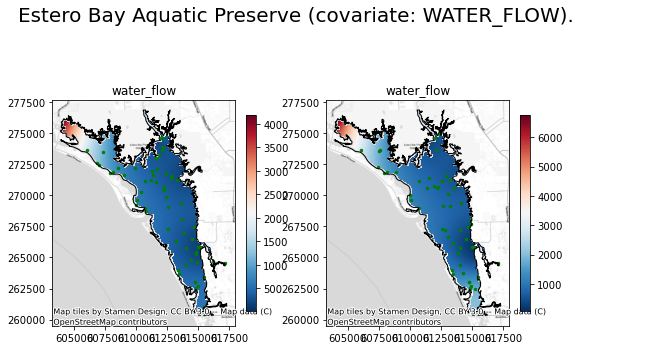

In [37]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [38]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 54.429628133773804 seconds ---
Start the interpolation with the RK method
--- Time lapse: 47.10818409919739 seconds ---


Plot the interpolation result

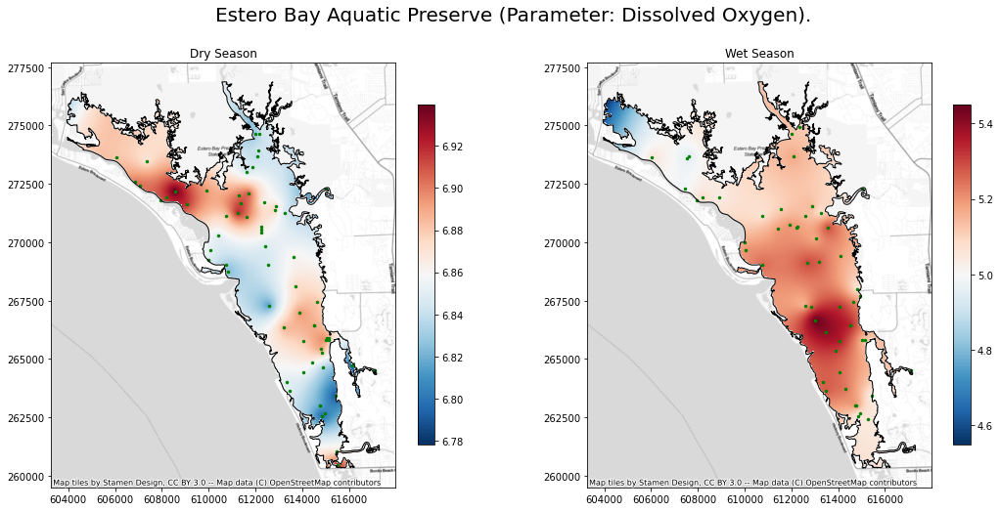

In [39]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.2.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="do_ldi_bathy"></a>


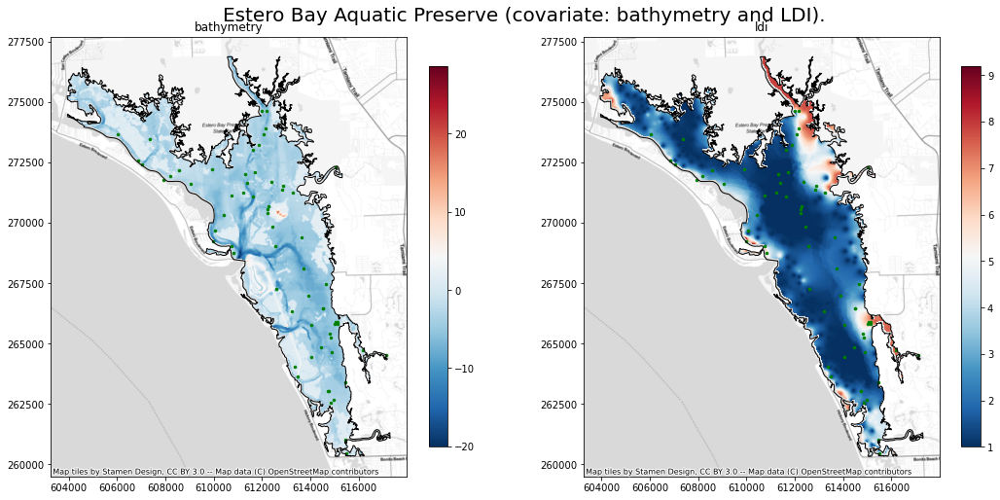

In [40]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [41]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 78.0924322605133 seconds ---
Start the interpolation with the RK method
--- Time lapse: 64.14268112182617 seconds ---


Plot interpolation results

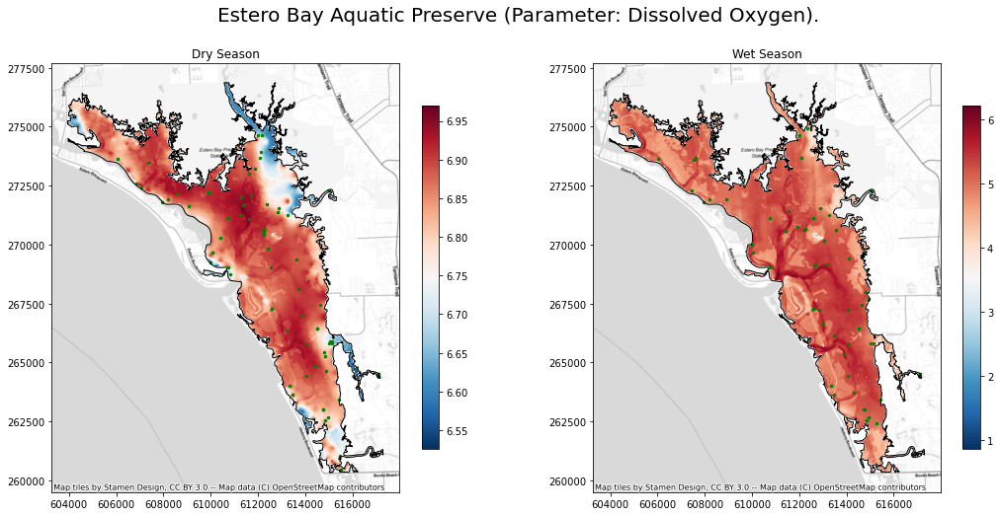

In [42]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.2.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="do_ldi_bathy_wf"></a>


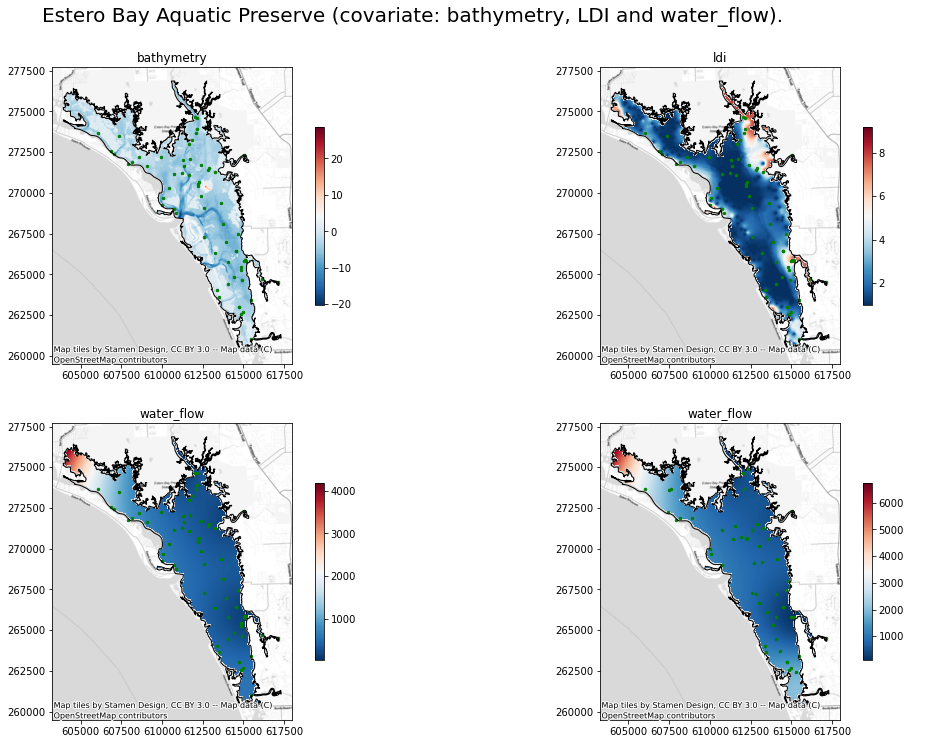

In [43]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [44]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 102.67177057266235 seconds ---
Start the interpolation with the RK method
--- Time lapse: 86.17982172966003 seconds ---


Plot interpolation results

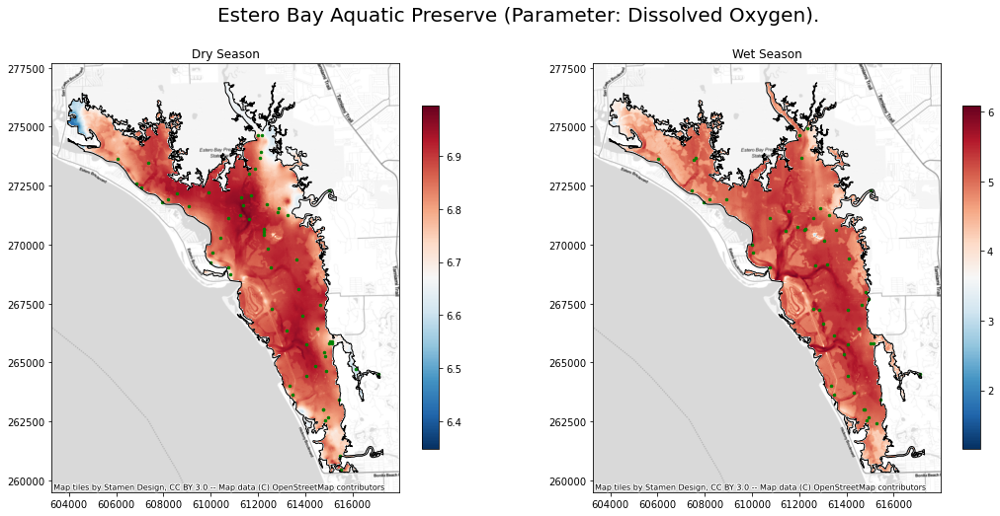

In [45]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.2.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="do_ldi_bathy_pd"></a>


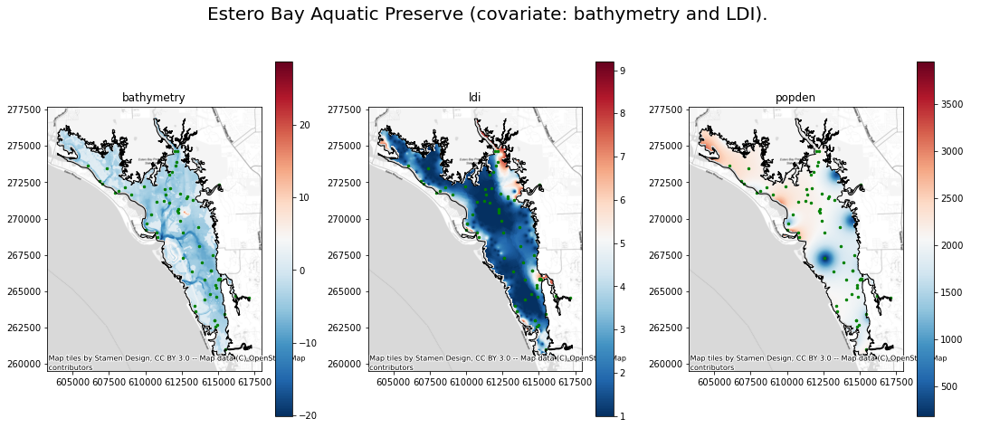

In [46]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [47]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 87.38659882545471 seconds ---
Start the interpolation with the RK method
--- Time lapse: 86.8490343093872 seconds ---


Plot interpolation results

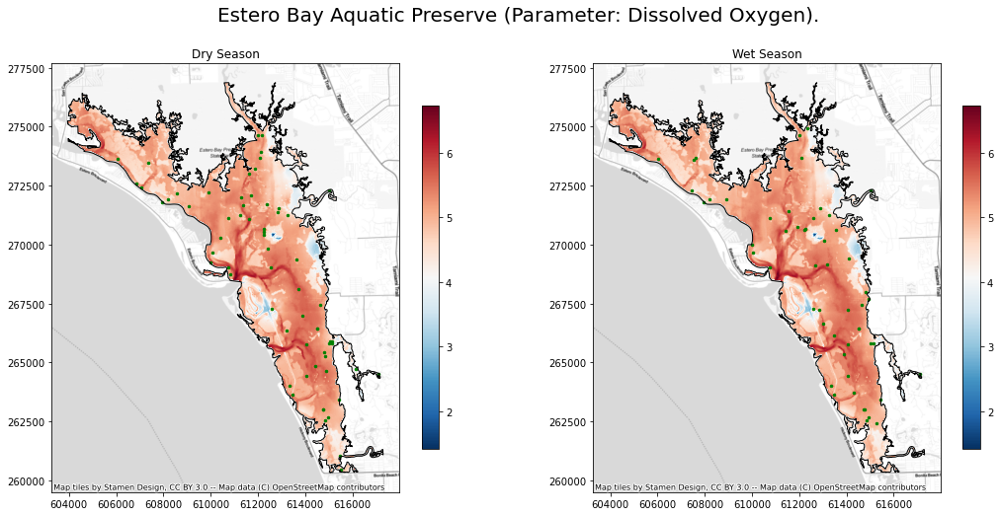

In [48]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.2.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="do_ldi_bathy_pd_wf"></a>


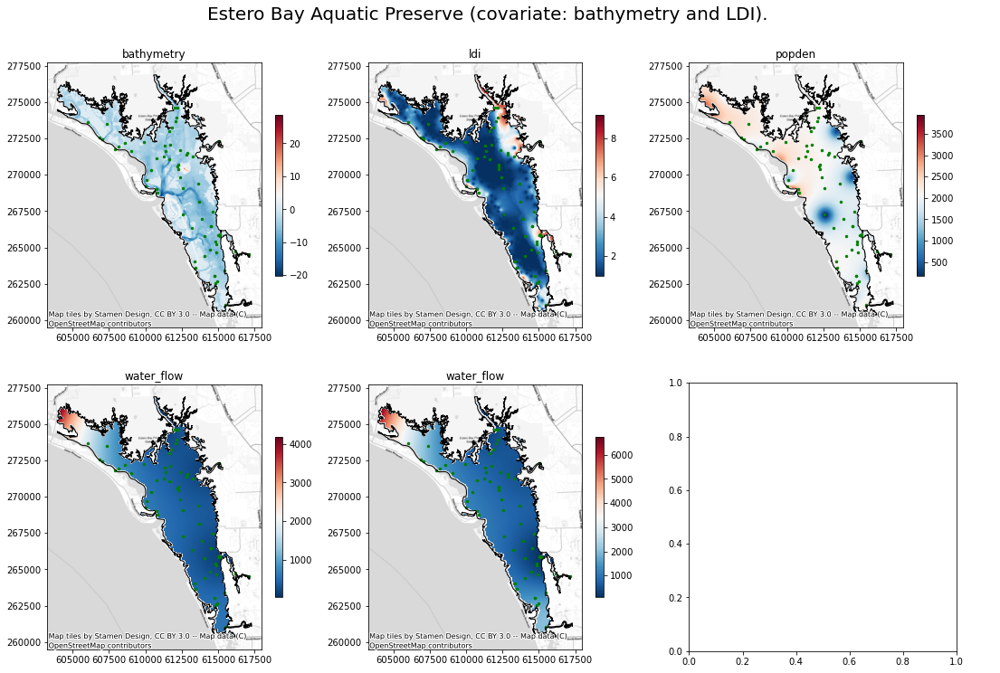

In [49]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [50]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 107.15080976486206 seconds ---
Start the interpolation with the RK method
--- Time lapse: 112.02976942062378 seconds ---


Plot interpolation results

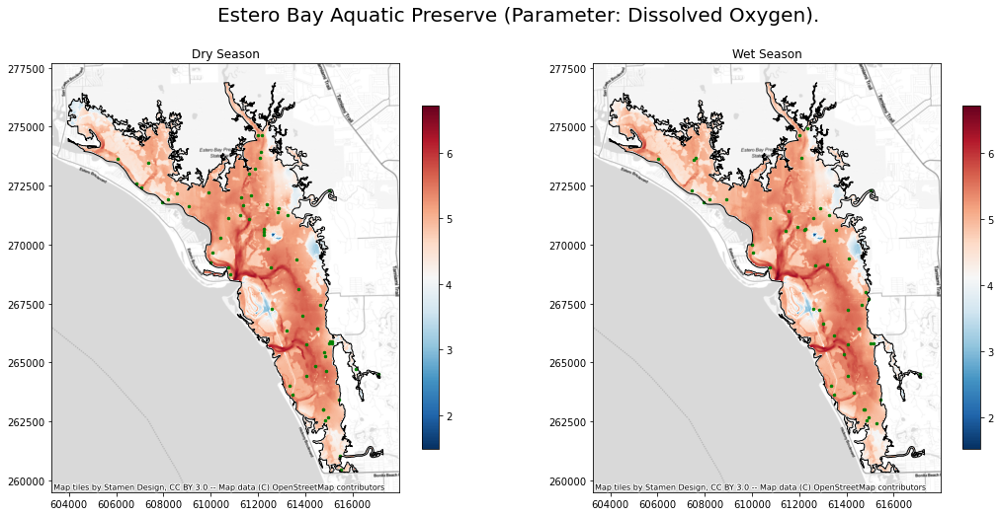

In [51]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.2.9 Validation Summary <a class="anchor" id="do_val_sum"></a>

In [52]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0421,-0.0401,1.0942
RK,-0.0162,-0.0168,1.0007
RK,0.0055,0.0038,0.9781
RK,0.0059,0.0067,1.0083
RK,-0.0081,-0.0085,1.0004
RK,-0.0187,-0.0173,1.0007
RK,-0.0245,-0.0210,0.9002
RK,-0.0198,-0.0126,0.9010


In [53]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0432,-0.0368,1.0001
RK,-0.0268,-0.0243,0.9503
RK,-0.0211,-0.0223,0.9619
RK,-0.0301,-0.0275,0.9751
RK,-0.0192,-0.0132,0.9213
RK,-0.0201,-0.0121,0.9219
RK,-0.0245,-0.0210,0.9002
RK,-0.0193,-0.0126,0.9018


## 3.3 Interpolation of Salinity <a class="anchor" id="s"></a>

Select salinity data

In [166]:
# Set variables of the program
year, Para, Para_ab = '2008','Salinity','S'

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

# ---------------------------- Uncomment in the first run --------------------------
dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\3680846639.py:17: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\3680846639.py:18: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


In [172]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)

Text(0.5, 1.0, 'Sampling points at Estero Bay Aquatic Preserve')

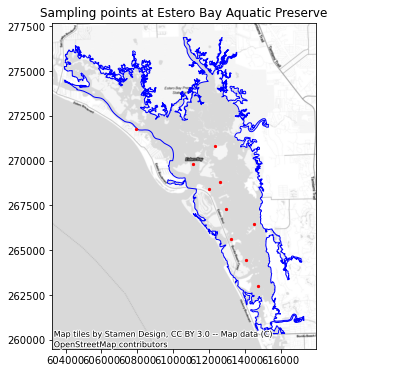

In [173]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.3.1 Regression Kriging of Salinity (covariate: bathymetry) <a class="anchor" id="s_bathy"></a>

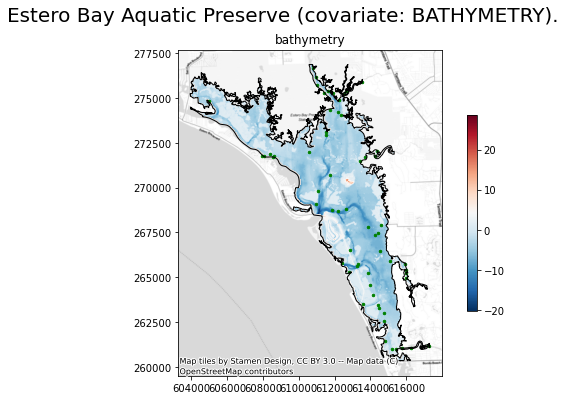

In [174]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [175]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 36.39519810676575 seconds ---
Start the interpolation with the RK method


ExecuteError: ERROR 040039: Not enough data to compute method.
Failed to execute (EBKRegressionPrediction).


In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)

### 3.3.2 Regression Kriging (covariate: LDI) <a class="anchor" id="s_ldi"></a>


RK interpolation

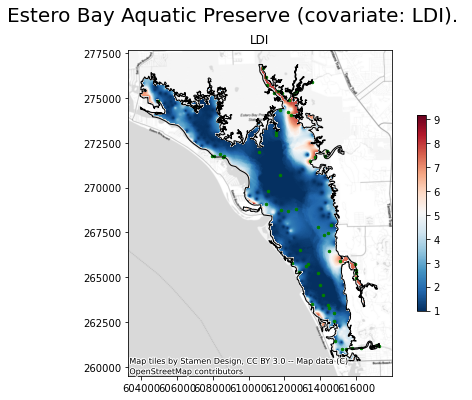

In [176]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [177]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 37.8609356880188 seconds ---
Start the interpolation with the RK method


ExecuteError: ERROR 040039: Not enough data to compute method.
Failed to execute (EBKRegressionPrediction).


Plot the interpolation result

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.3.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="s_pd"></a>


RK interpolation

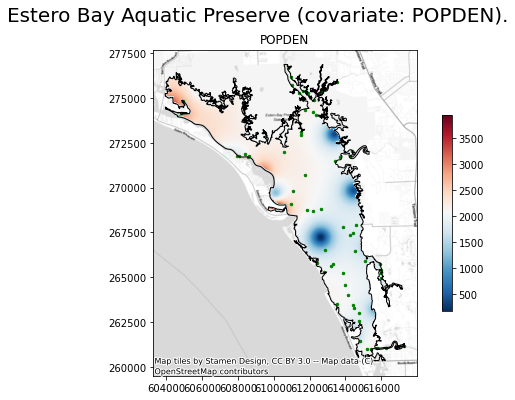

In [182]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [186]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 40.226799726486206 seconds ---
Start the interpolation with the RK method


ExecuteError: ERROR 040039: Not enough data to compute method.
Failed to execute (EBKRegressionPrediction).


Plot the interpolation result

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.3.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="s_wf"></a>

RK interpolation

In [ ]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [ ]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Plot the interpolation result

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.3.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="s_ldi_bathy"></a>


In [ ]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.3.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="s_ldi_bathy_wf"></a>


In [ ]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.3.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="s_ldi_bathy_pd"></a>


In [ ]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.3.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="s_ldi_bathy_pd_wf"></a>


In [ ]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.3.9 Validation Summary <a class="anchor" id="s_val_sum"></a>

In [ ]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

In [ ]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

## 3.4 Interpolation of Total Nitrogen <a class="anchor" id="tn"></a>

Select data

In [70]:
# Set variables of the program
Para, Para_ab = 'Total Nitrogen',"TN"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\2032748999.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\2032748999.py:11: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Preview data

In [71]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [72]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Estero Bay Aquatic Preserve')

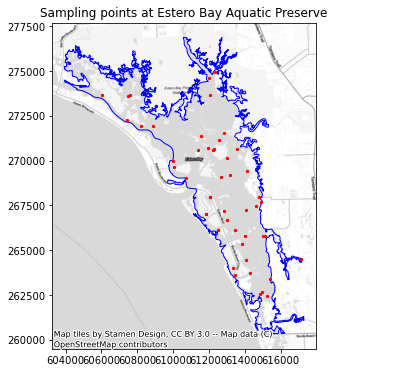

In [73]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.4.1 Regression Kriging of Total Nitrogen (covariate: bathymetry) <a class="anchor" id="tn_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

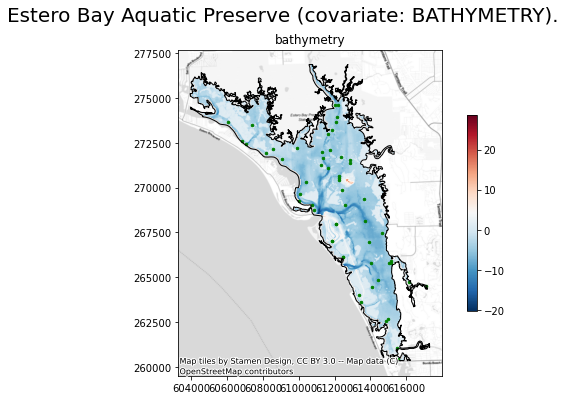

In [74]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [75]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 48.848509788513184 seconds ---
Start the interpolation with the RK method
--- Time lapse: 44.1739981174469 seconds ---


C:\Users\qiangy\AppData\Local\ESRI\conda\envs\geo3\lib\site-packages\matplotlib\image.py:487: RuntimeWarning: overflow encountered in true_divide
  A_scaled /= ((a_max - a_min) / frac)


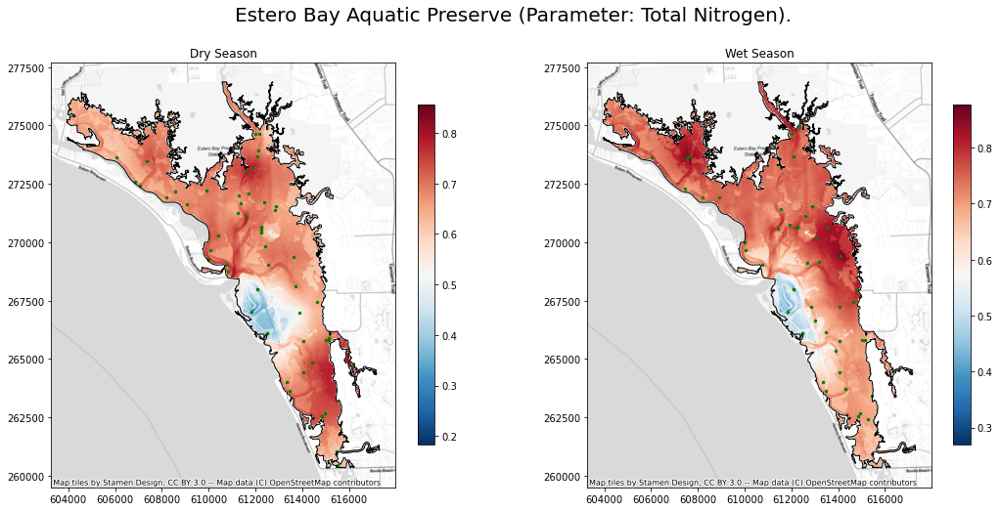

In [76]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.4.2 Regression Kriging (covariate: LDI) <a class="anchor" id="tn_ldi"></a>


RK interpolation

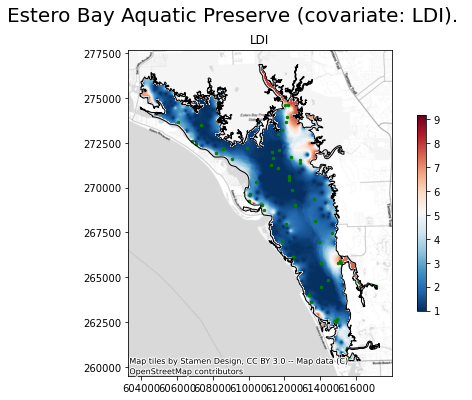

In [77]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [78]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 51.97017168998718 seconds ---
Start the interpolation with the RK method
--- Time lapse: 45.95324397087097 seconds ---


Plot the interpolation result

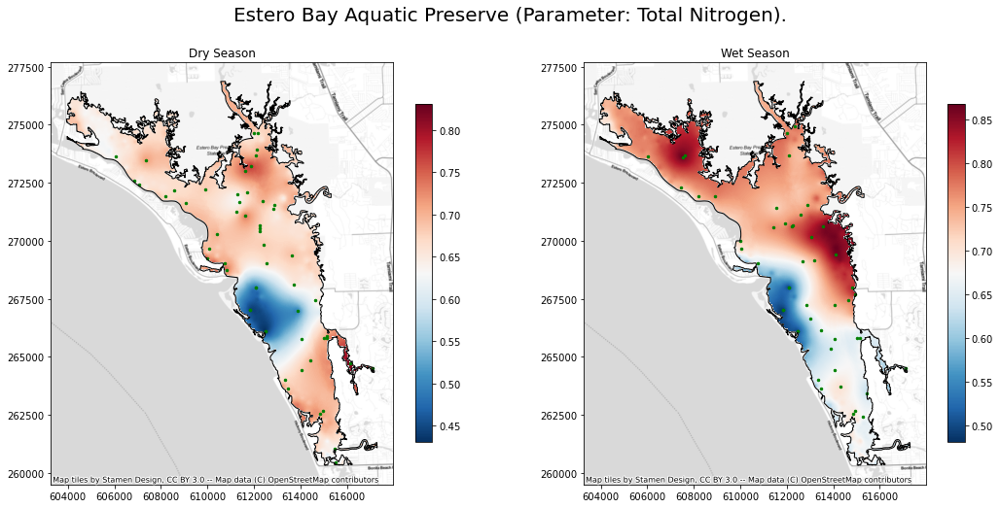

In [79]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.4.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="tn_pd"></a>


RK interpolation

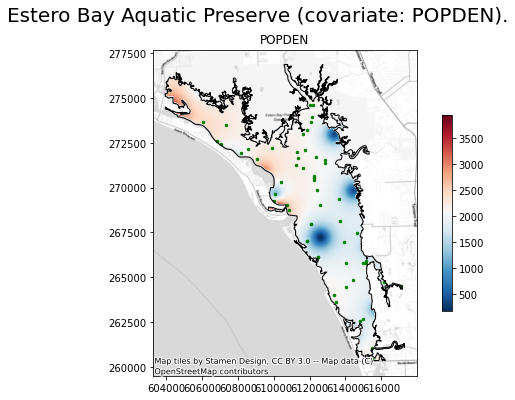

In [80]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [81]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 53.883061170578 seconds ---
Start the interpolation with the RK method
--- Time lapse: 47.25277304649353 seconds ---


Plot the interpolation result

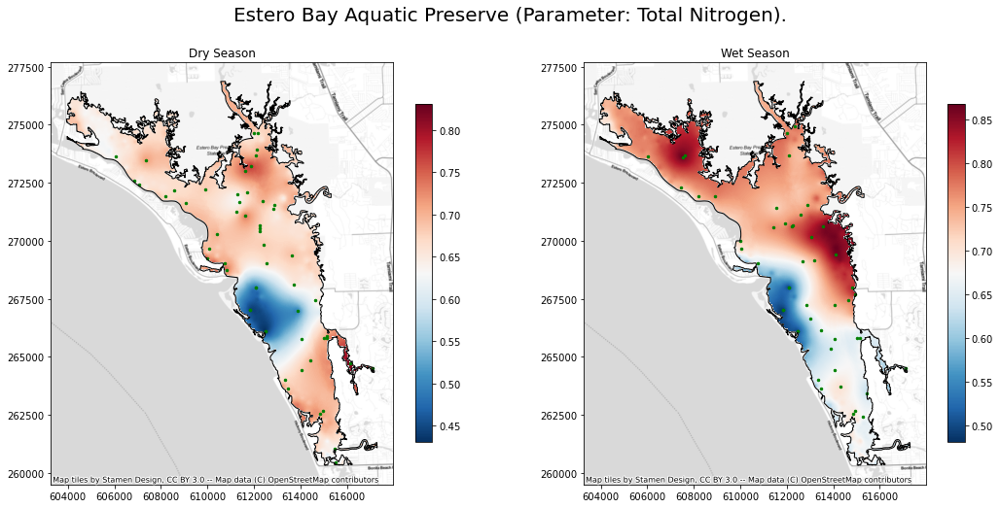

In [82]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.4.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="tn_wf"></a>

RK interpolation

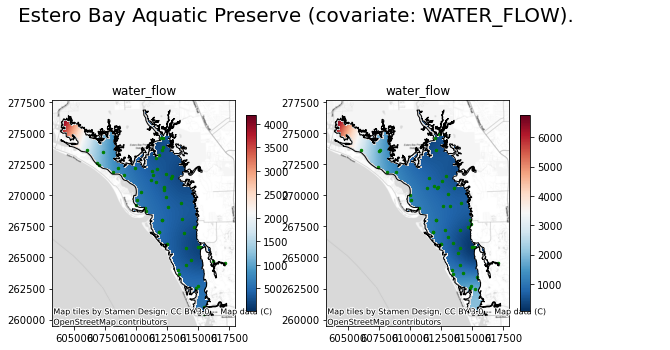

In [83]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [84]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 49.129754066467285 seconds ---
Start the interpolation with the RK method
--- Time lapse: 48.56426405906677 seconds ---


Plot the interpolation result

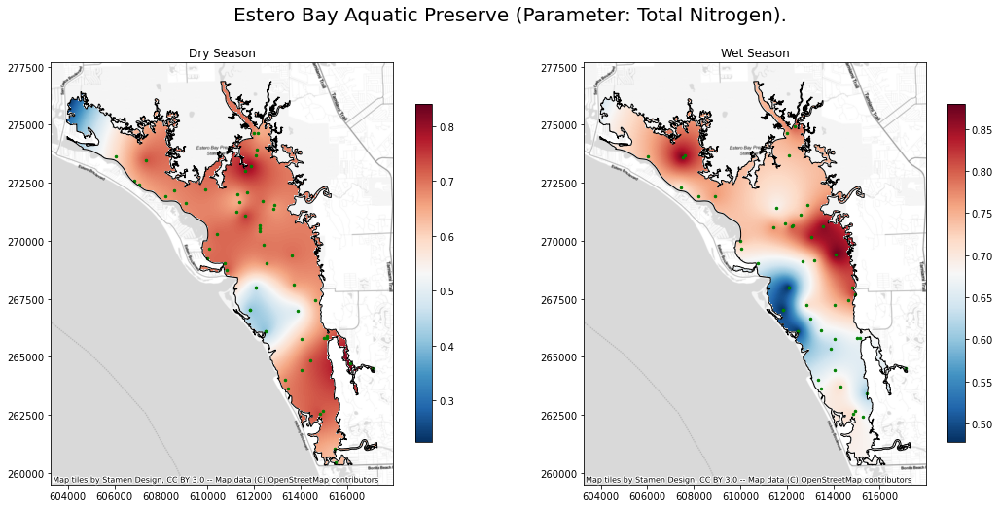

In [85]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.4.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="tn_ldi_bathy"></a>


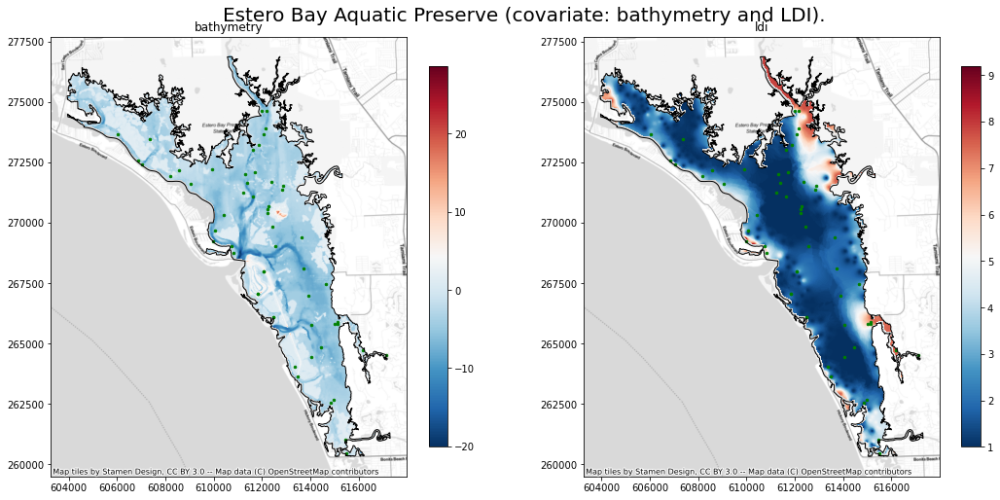

In [86]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [87]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 68.77028608322144 seconds ---
Start the interpolation with the RK method
--- Time lapse: 63.288930892944336 seconds ---


Plot interpolation results

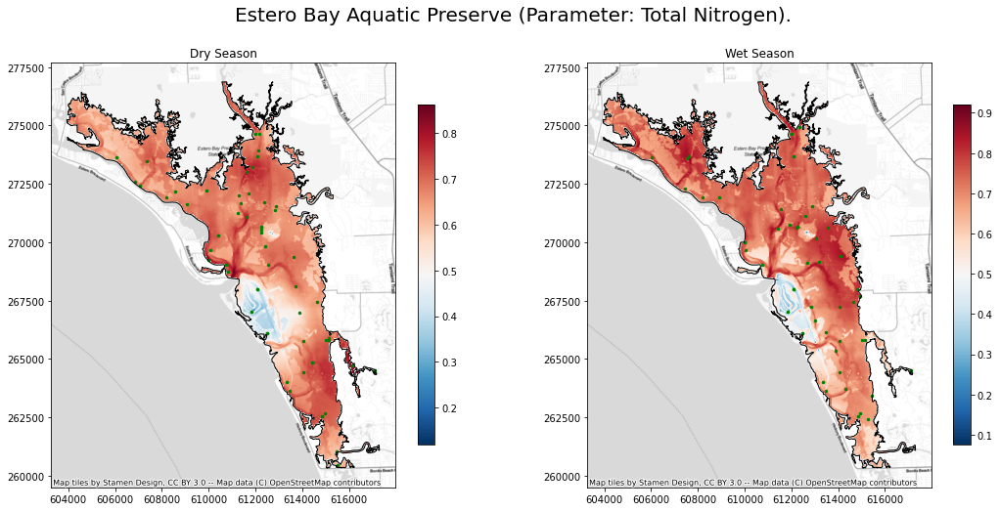

In [88]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.4.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="tn_ldi_bathy_wf"></a>

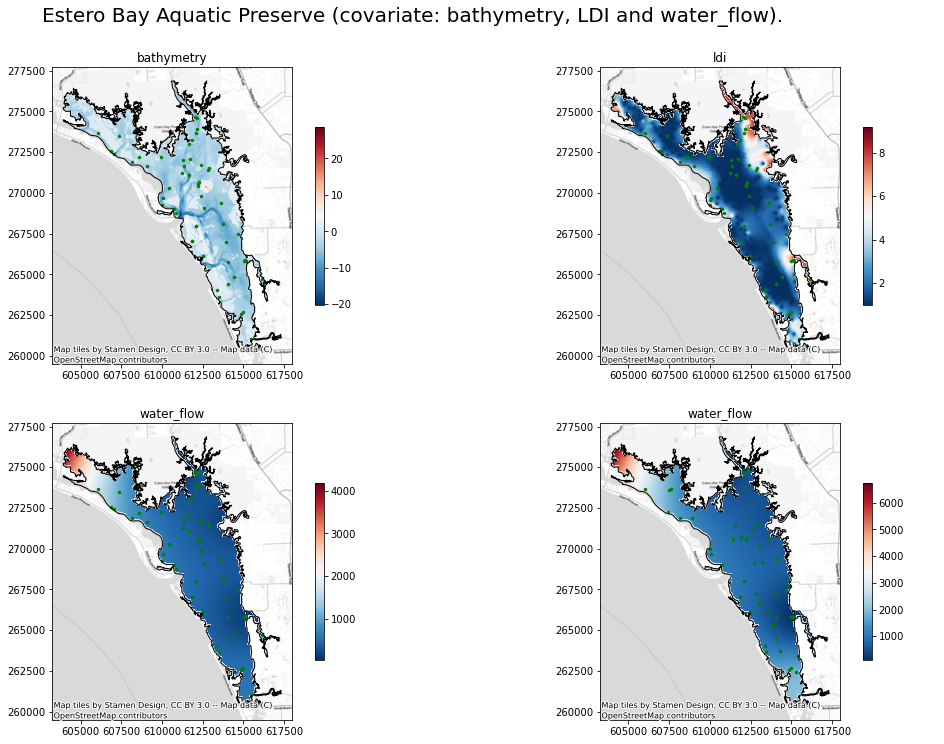

In [89]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [90]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 96.45235347747803 seconds ---
Start the interpolation with the RK method
--- Time lapse: 85.7010760307312 seconds ---


Plot interpolation results

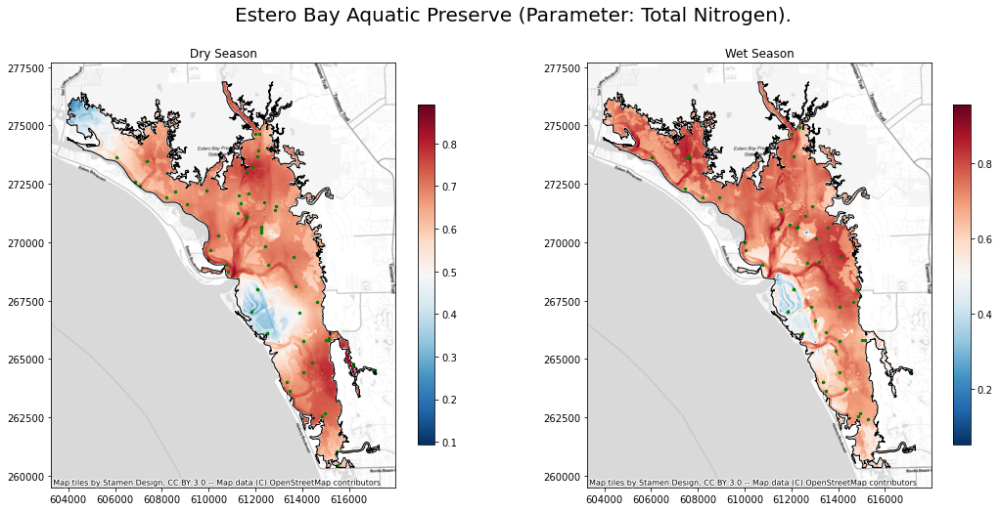

In [91]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.4.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="tn_ldi_bathy_pd"></a>


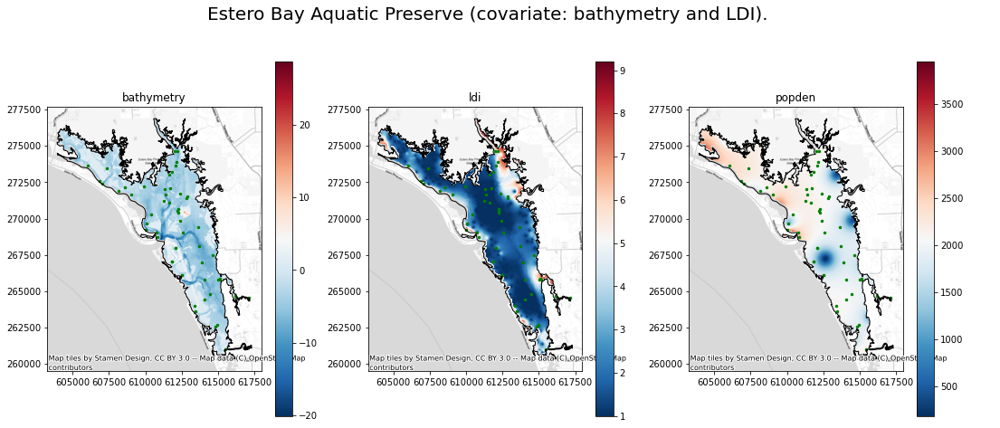

In [92]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [93]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 83.16993999481201 seconds ---
Start the interpolation with the RK method
--- Time lapse: 84.27486658096313 seconds ---


Plot interpolation results

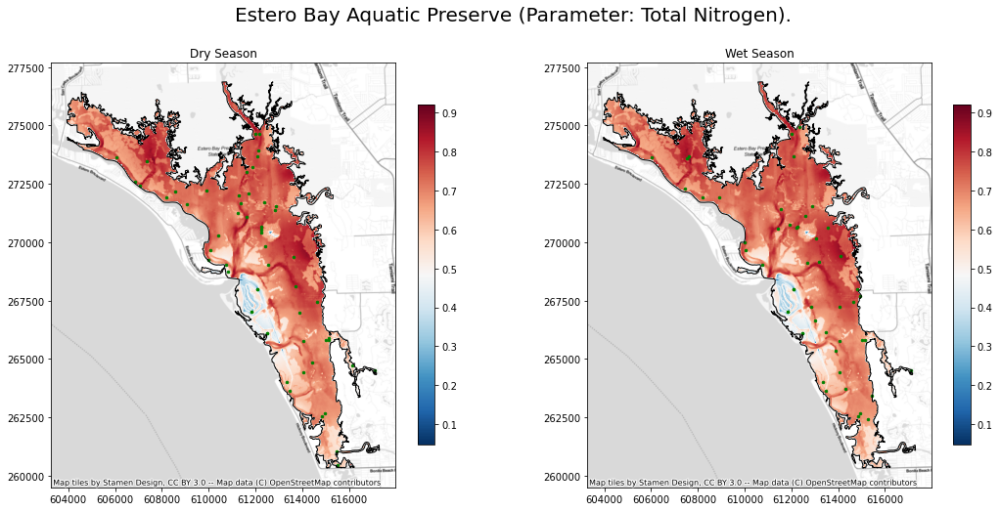

In [94]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.4.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="tn_ldi_bathy_pd_wf"></a>


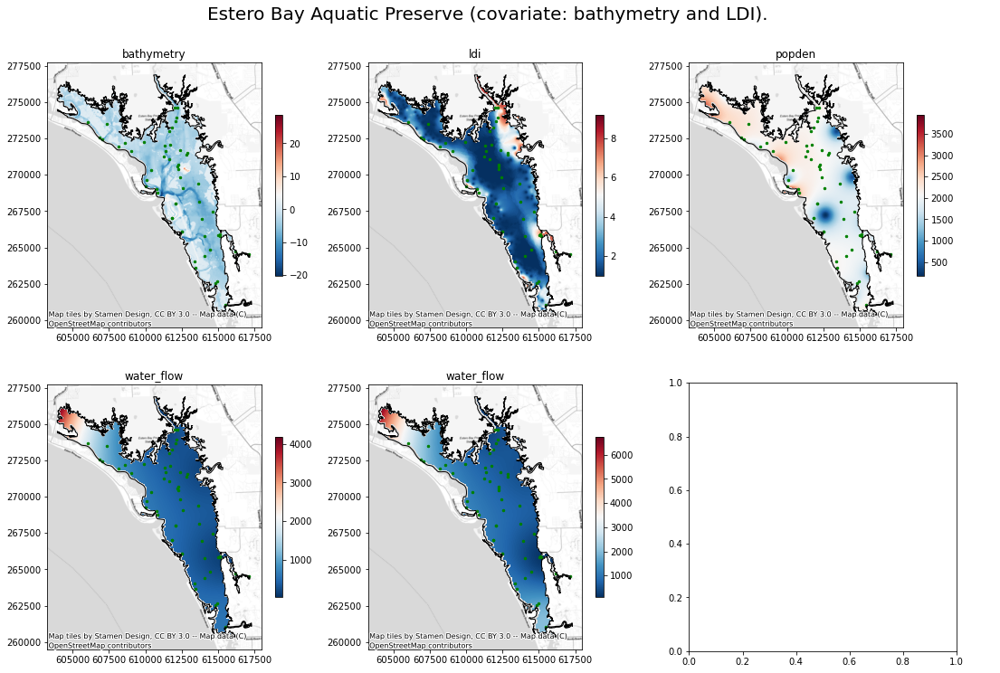

In [95]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [96]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 94.56637454032898 seconds ---
Start the interpolation with the RK method
--- Time lapse: 100.83752250671387 seconds ---


Plot interpolation results

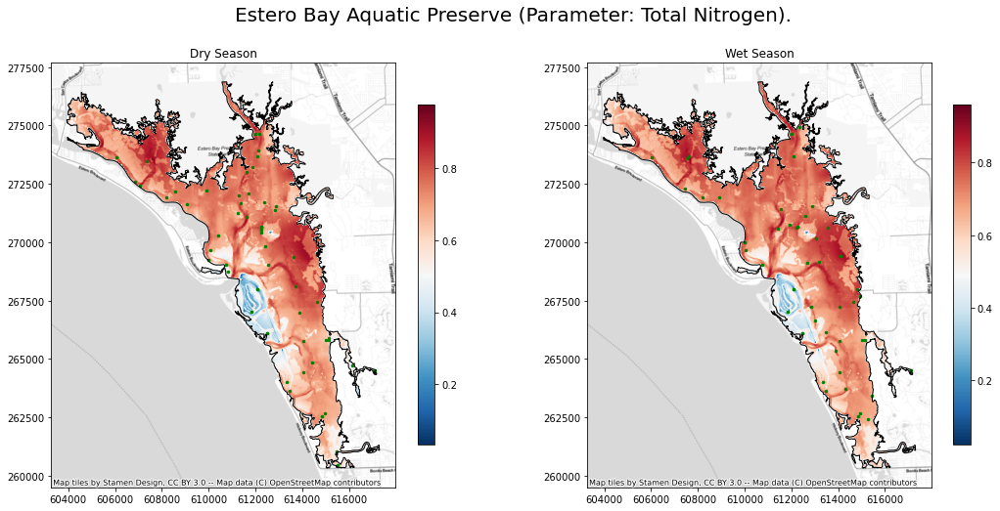

In [97]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.4.9 Validation Summary <a class="anchor" id="tn_val_sum"></a>

In [98]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0086,-0.0331,0.2285
RK,-0.0107,-0.0441,0.2338
RK,-0.0140,-0.0600,0.2304
RK,-0.0057,-0.0214,0.2319
RK,-0.0086,-0.0316,0.2313
RK,-0.0091,-0.0275,0.2299
RK,-0.0132,-0.0522,0.2208
RK,-0.0093,-0.0252,0.2220


In [99]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0106,-0.0423,0.2275
RK,-0.0056,-0.0222,0.2268
RK,-0.0149,-0.0584,0.2253
RK,-0.0137,-0.0531,0.2269
RK,-0.0122,-0.0486,0.2222
RK,-0.0098,-0.0399,0.2223
RK,-0.0132,-0.0522,0.2208
RK,-0.0115,-0.0368,0.2212


## 3.5 Interpolation of Turbidity <a class="anchor" id="t"></a>

Select data

In [100]:
year, Para,Para_ab = "2014", 'Turbidity', "T"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\2466164672.py:15: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\2466164672.py:16: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Preview data

In [101]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [102]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Estero Bay Aquatic Preserve')

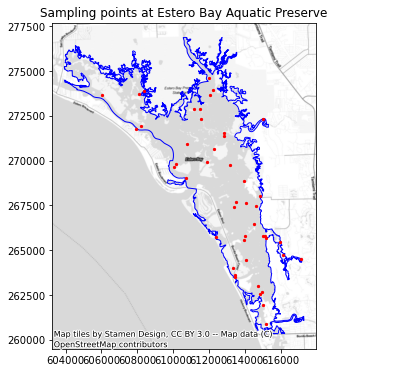

In [103]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.5.1 Regression Kriging of Turbidity (covariate: bathymetry) <a class="anchor" id="t_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

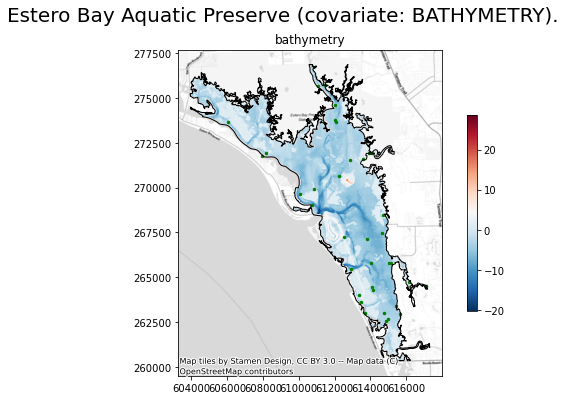

In [104]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [105]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 33.98200440406799 seconds ---
Start the interpolation with the RK method
--- Time lapse: 42.40549159049988 seconds ---


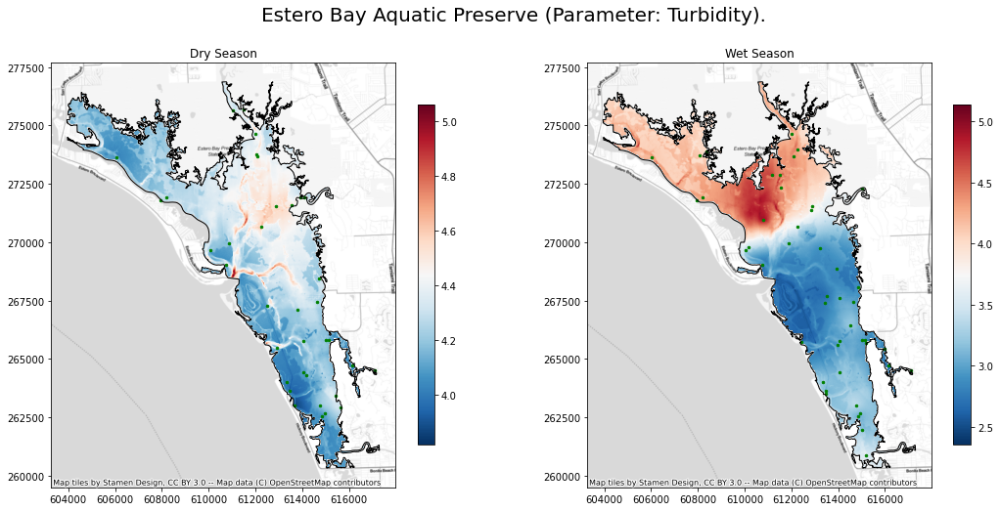

In [106]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.5.2 Regression Kriging (covariate: LDI) <a class="anchor" id="t_ldi"></a>


RK interpolation

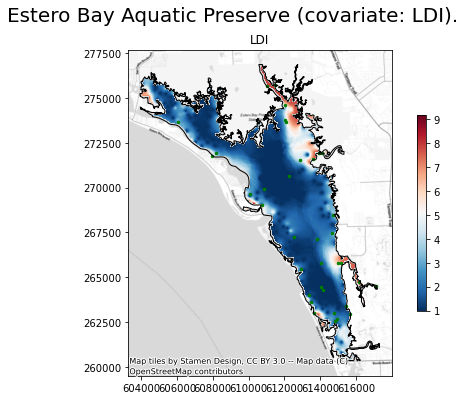

In [107]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [108]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 37.8468873500824 seconds ---
Start the interpolation with the RK method
--- Time lapse: 44.33834385871887 seconds ---


Plot the interpolation result

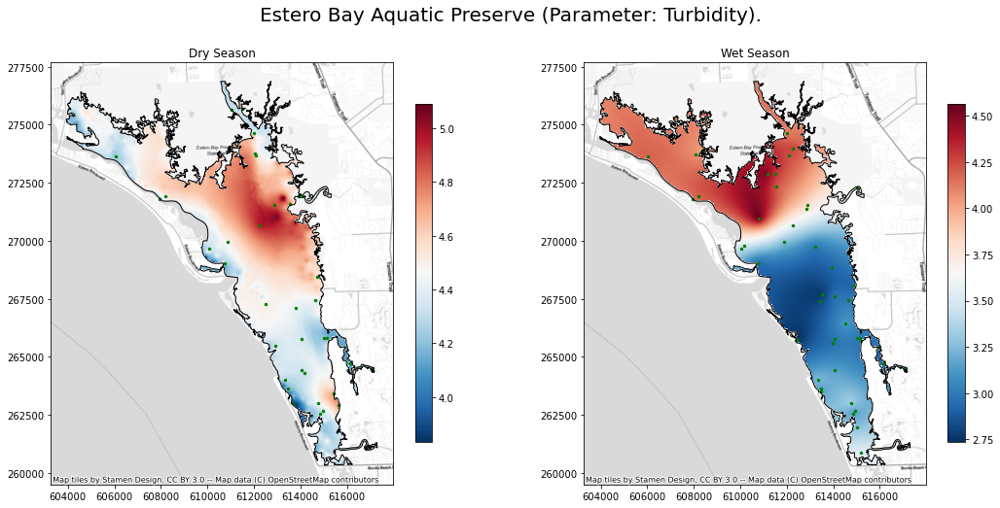

In [109]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="t_pd"></a>


RK interpolation

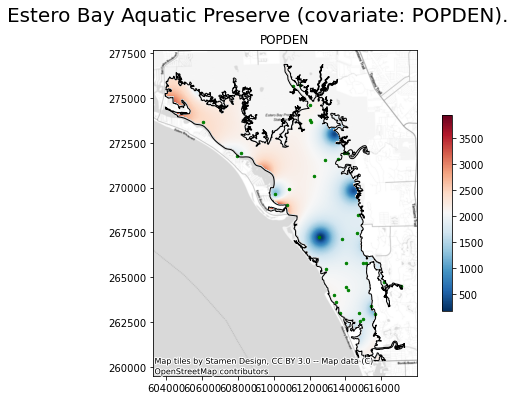

In [110]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [111]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 34.572667360305786 seconds ---
Start the interpolation with the RK method
--- Time lapse: 41.84147667884827 seconds ---


Plot the interpolation result

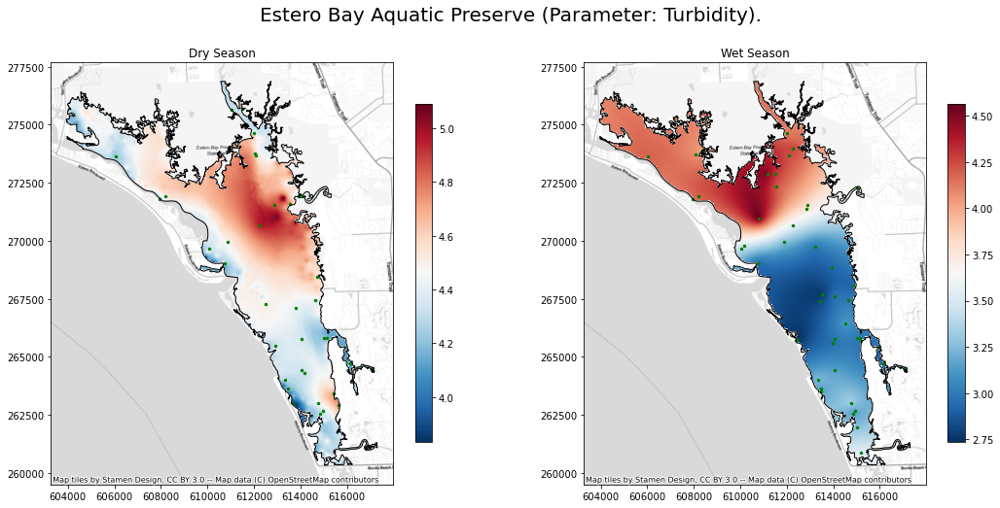

In [112]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="t_wf"></a>

RK interpolation

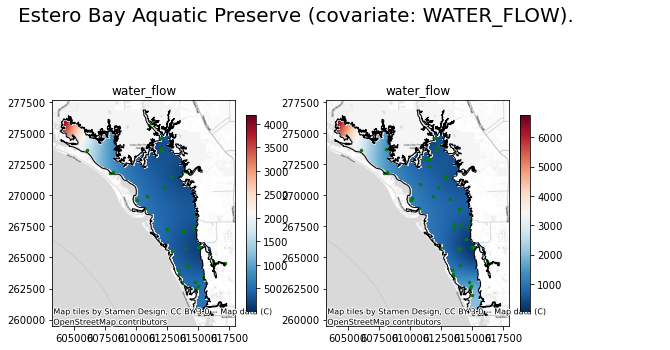

In [113]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [114]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 34.98499655723572 seconds ---
Start the interpolation with the RK method
--- Time lapse: 44.17351269721985 seconds ---


Plot the interpolation result

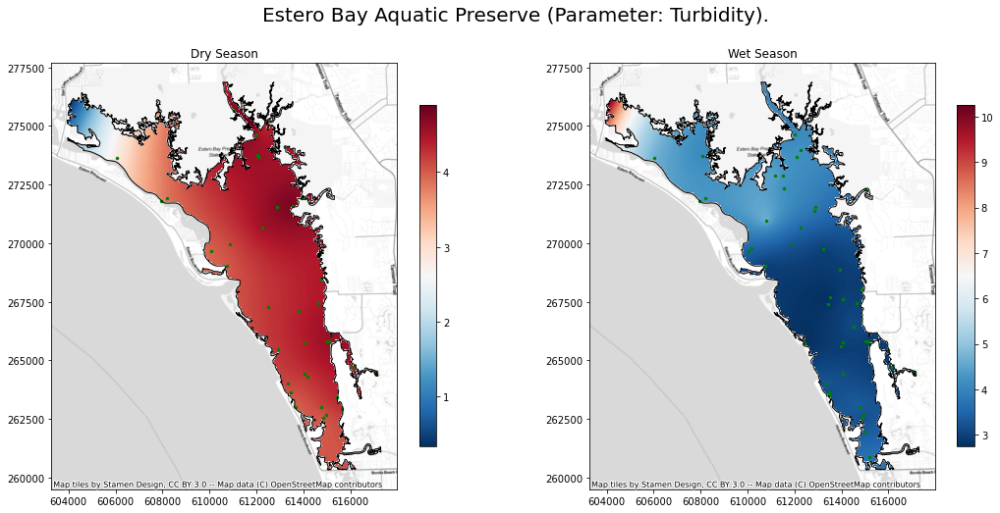

In [115]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.5.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="t_ldi_bathy"></a>


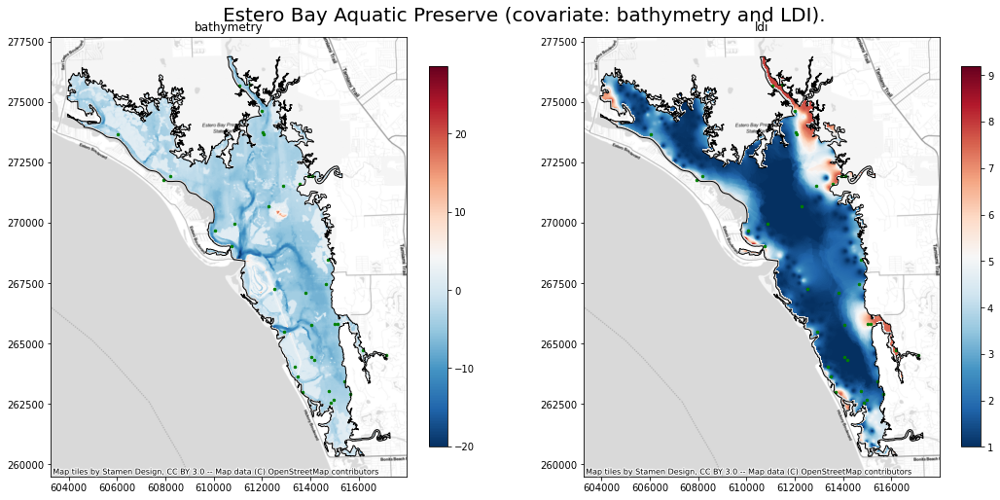

In [116]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [117]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 48.744611740112305 seconds ---
Start the interpolation with the RK method
--- Time lapse: 59.12979006767273 seconds ---


Plot interpolation results

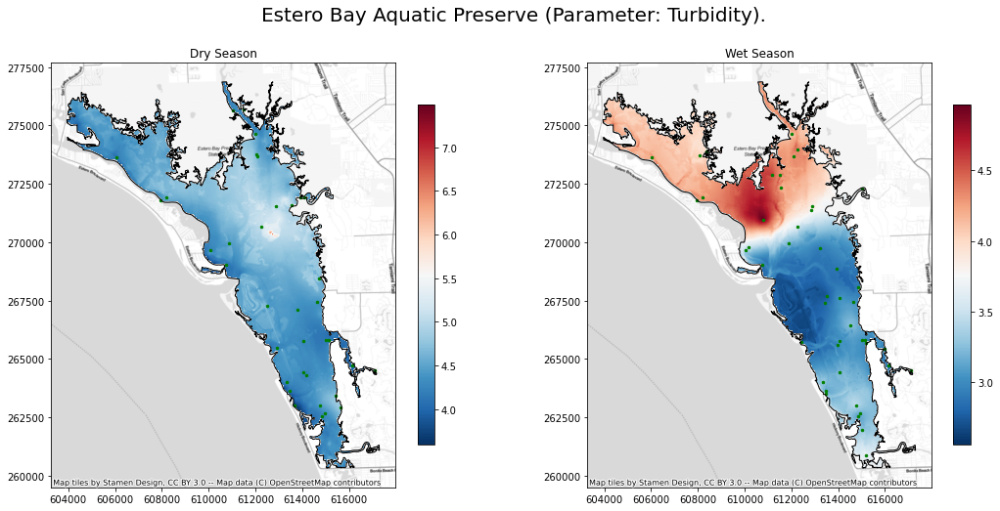

In [118]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.5.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="t_ldi_bathy_wf"></a>

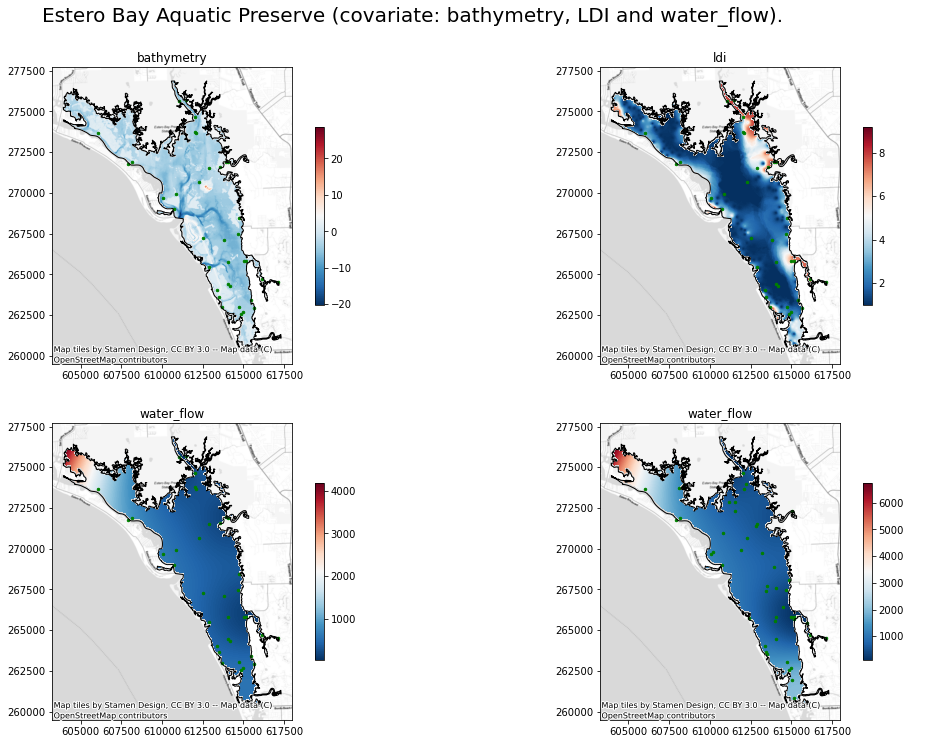

In [119]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [120]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 62.321521282196045 seconds ---
Start the interpolation with the RK method
--- Time lapse: 75.09861445426941 seconds ---


Plot interpolation results

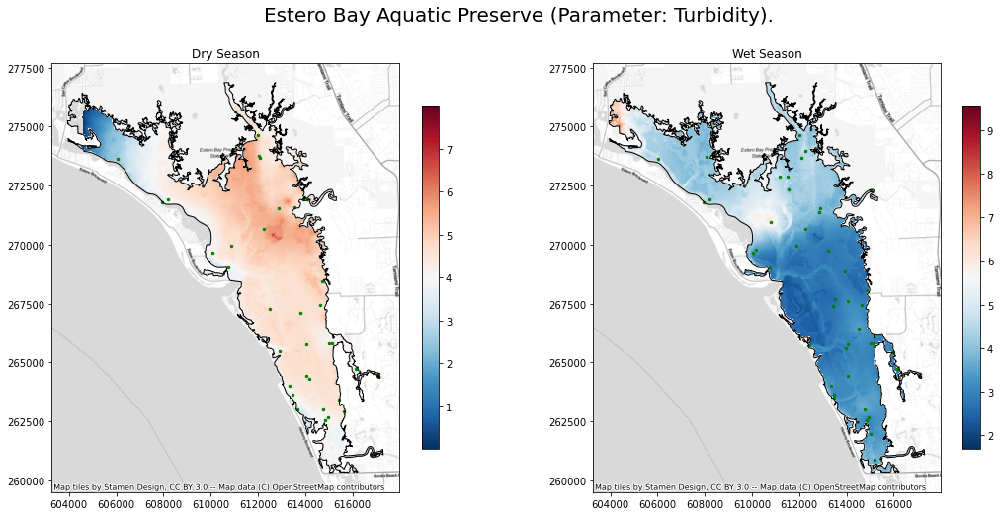

In [121]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.5.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="t_ldi_bathy_pd"></a>


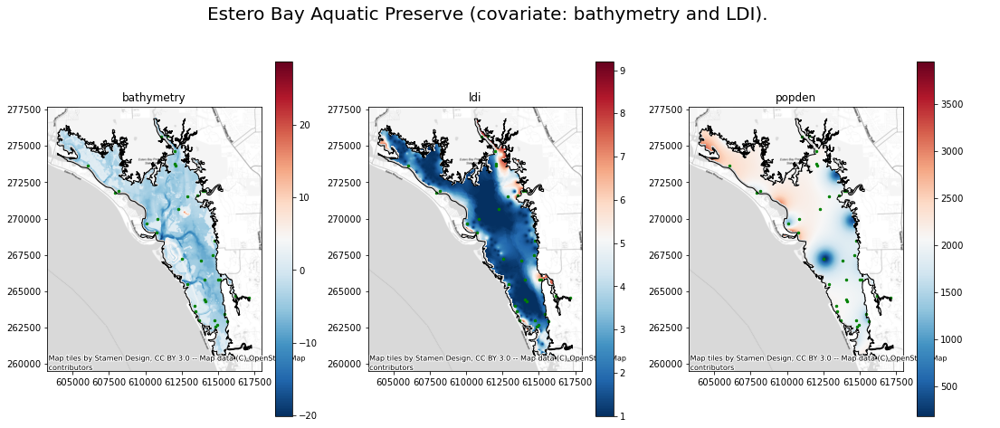

In [122]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [123]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 73.38000583648682 seconds ---
Start the interpolation with the RK method
--- Time lapse: 78.07640933990479 seconds ---


Plot interpolation results

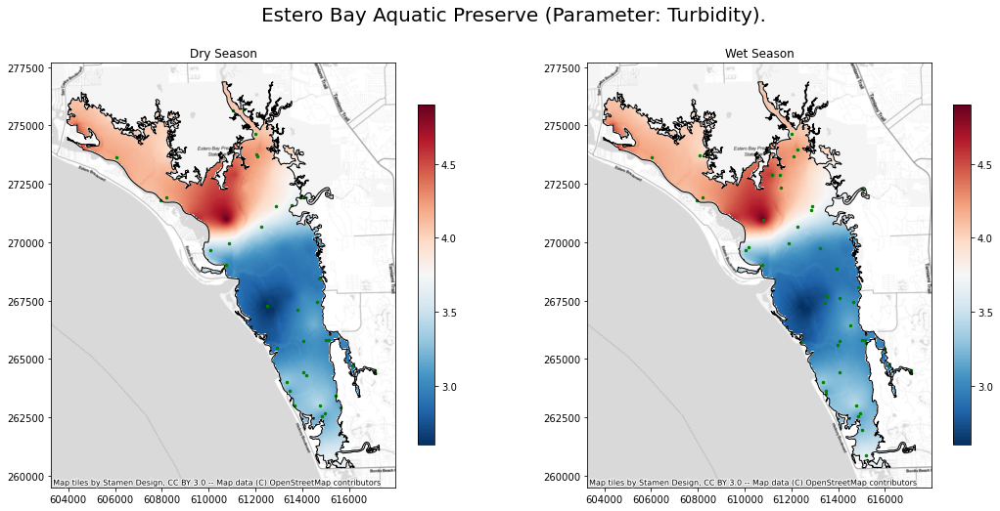

In [124]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.5.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="t_ldi_bathy_pd_wf"></a>


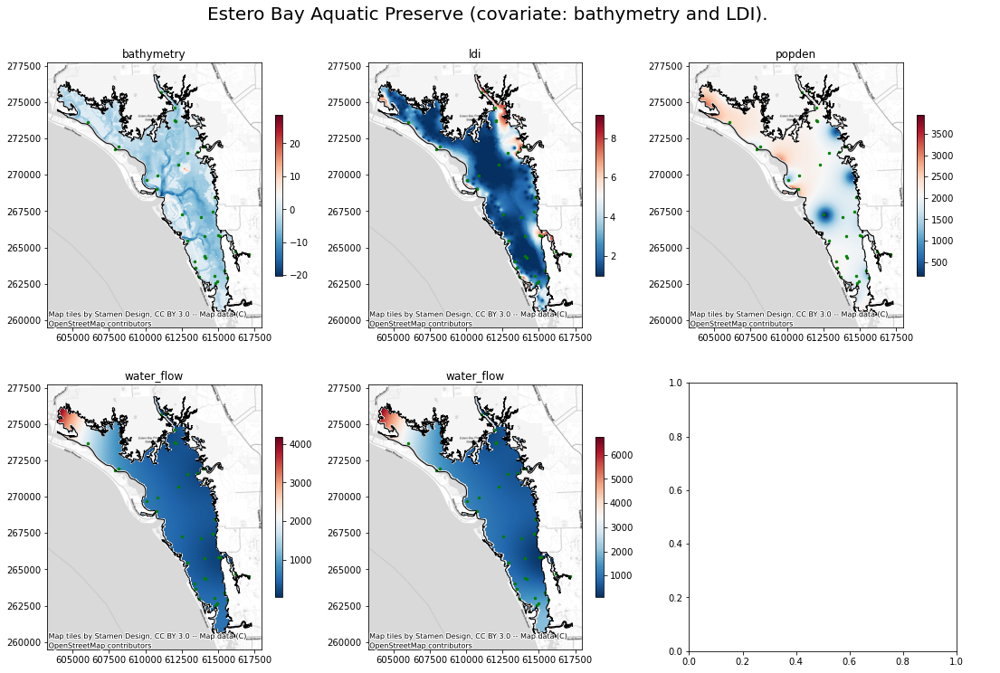

In [125]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [126]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 95.58563303947449 seconds ---
Start the interpolation with the RK method
--- Time lapse: 98.2466607093811 seconds ---


Plot interpolation results

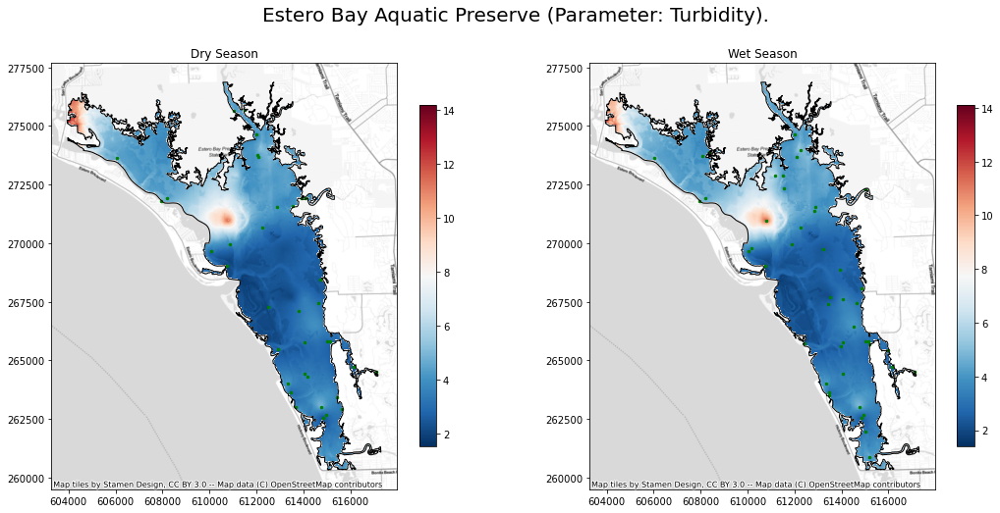

In [127]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.5.9 Validation Summary <a class="anchor" id="t_val_sum"></a>

In [128]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.0485,0.0144,2.1732
RK,0.1058,0.0448,2.1649
RK,0.1200,0.0469,2.1431
RK,0.0235,0.0080,2.1345
RK,0.0621,0.0204,2.1597
RK,0.1327,0.0435,2.1449
RK,-0.0056,-0.0158,1.6735
RK,-0.0294,-0.0504,1.6874


In [129]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.0269,-0.0028,1.6699
RK,-0.0116,-0.0215,1.6746
RK,-0.0023,-0.0160,1.6704
RK,0.0222,-0.0068,1.6769
RK,0.0156,-0.0023,1.6809
RK,0.0390,-0.0013,1.7027
RK,-0.0056,-0.0158,1.6735
RK,-0.0260,-0.0493,1.6871


## 3.6 Interpolation of Secchi Depth <a class="anchor" id="sd"></a>

Select data

In [130]:
year, Para,Para_ab = "2006", 'Secchi Depth', "SD"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\3488678120.py:15: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\3488678120.py:16: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Preview data

In [131]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [132]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Estero Bay Aquatic Preserve')

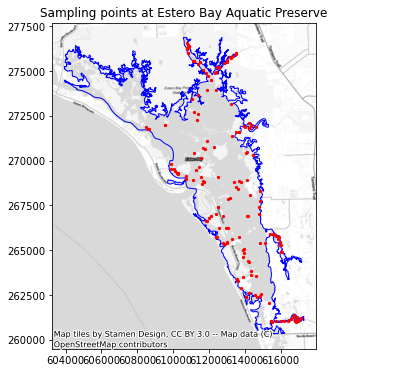

In [133]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.6.1 Regression Kriging of Turbidity (covariate: bathymetry) <a class="anchor" id="sd_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

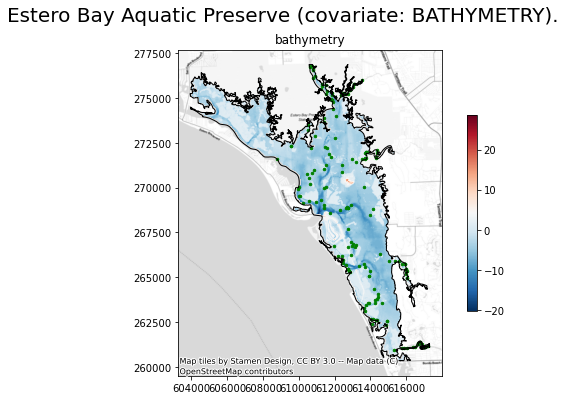

In [134]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [135]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 81.88396215438843 seconds ---
Start the interpolation with the RK method
--- Time lapse: 77.98871541023254 seconds ---


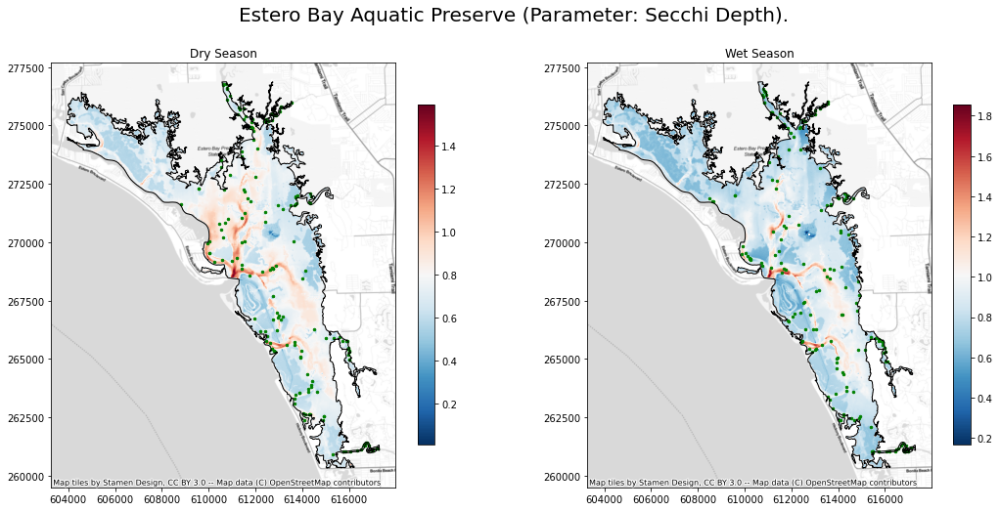

In [136]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.6.2 Regression Kriging (covariate: LDI) <a class="anchor" id="sd_ldi"></a>


RK interpolation

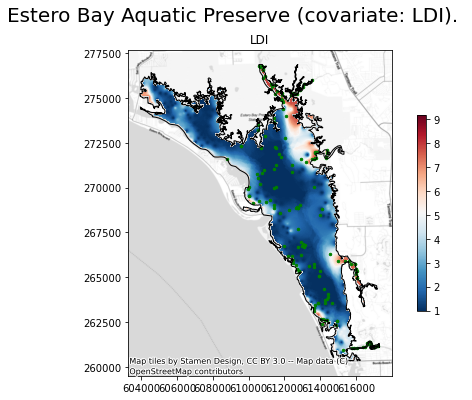

In [137]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [138]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 83.59820032119751 seconds ---
Start the interpolation with the RK method
--- Time lapse: 72.00861406326294 seconds ---


Plot the interpolation result

C:\Users\qiangy\AppData\Local\ESRI\conda\envs\geo3\lib\site-packages\matplotlib\image.py:487: RuntimeWarning: overflow encountered in true_divide
  A_scaled /= ((a_max - a_min) / frac)


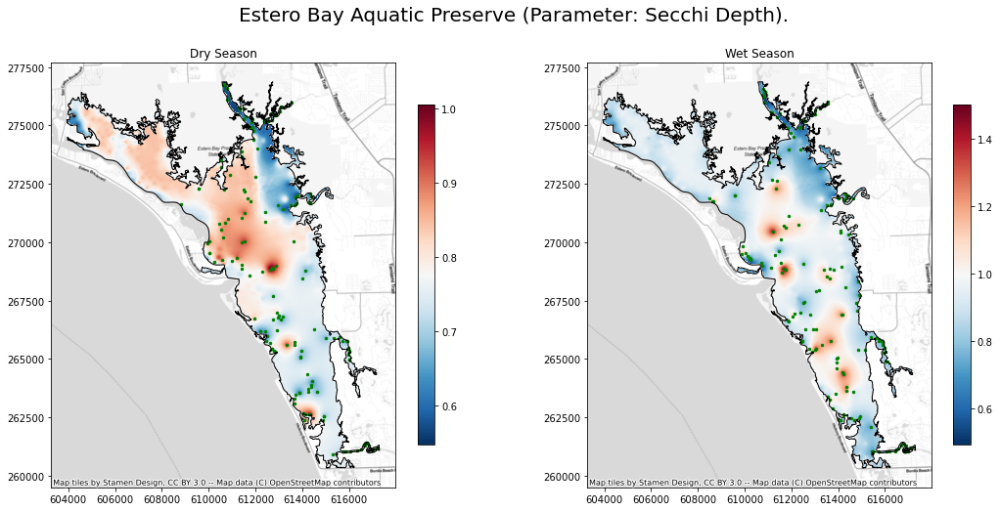

In [139]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="t_pd"></a>


RK interpolation

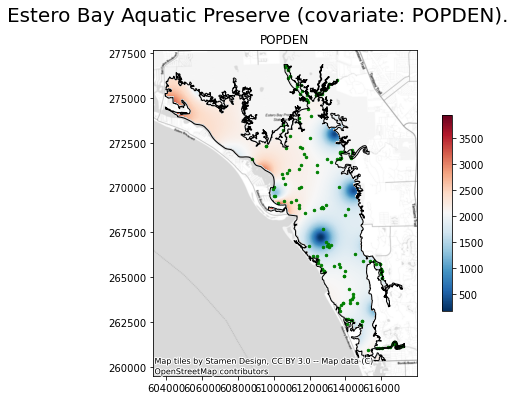

In [140]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [141]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 81.7326877117157 seconds ---
Start the interpolation with the RK method
--- Time lapse: 71.0375075340271 seconds ---


Plot the interpolation result

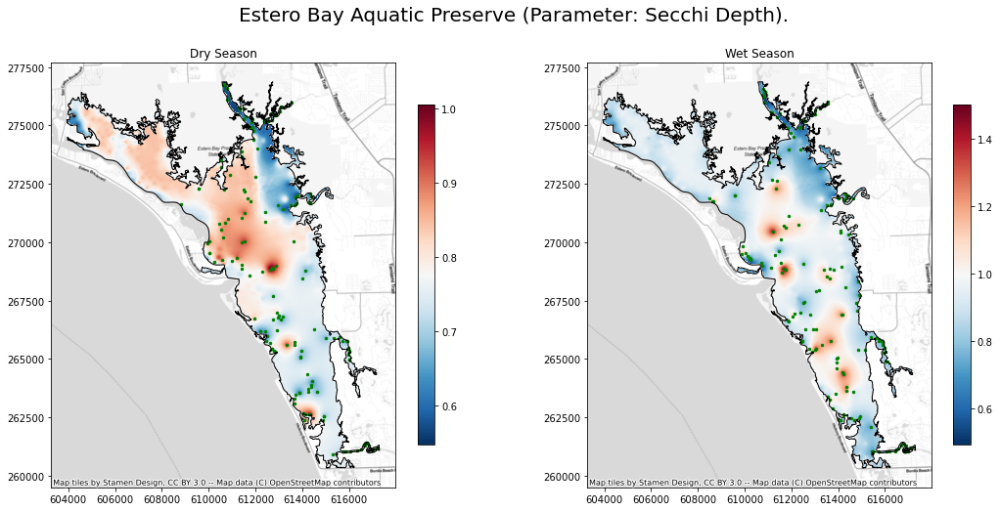

In [142]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="t_wf"></a>

RK interpolation

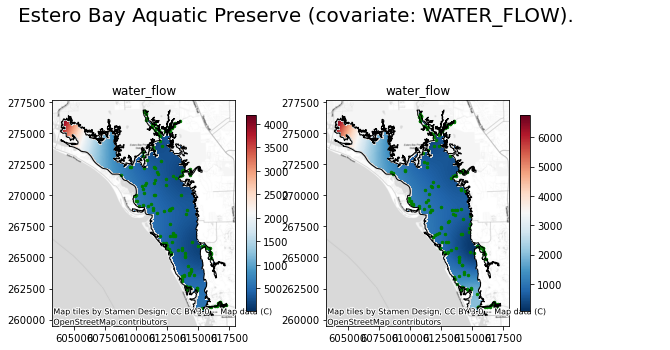

In [143]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [144]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 77.39769887924194 seconds ---
Start the interpolation with the RK method
--- Time lapse: 74.69706964492798 seconds ---


Plot the interpolation result

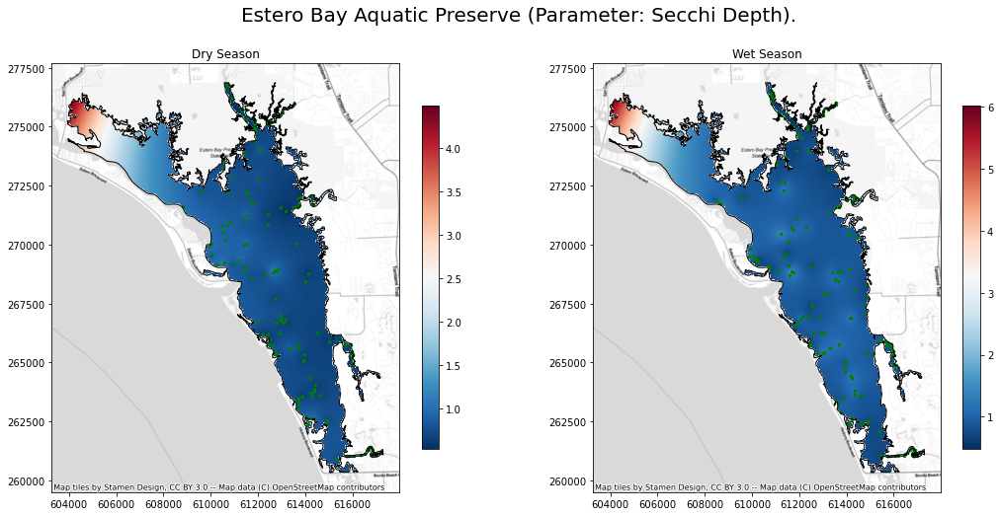

In [145]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.5.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="t_ldi_bathy"></a>


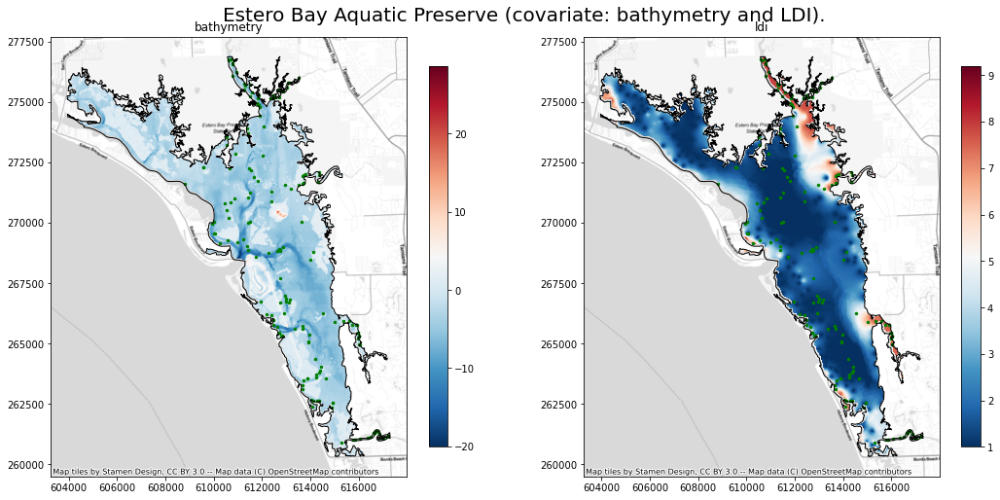

In [146]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [147]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 112.30815315246582 seconds ---
Start the interpolation with the RK method
--- Time lapse: 111.41089129447937 seconds ---


Plot interpolation results

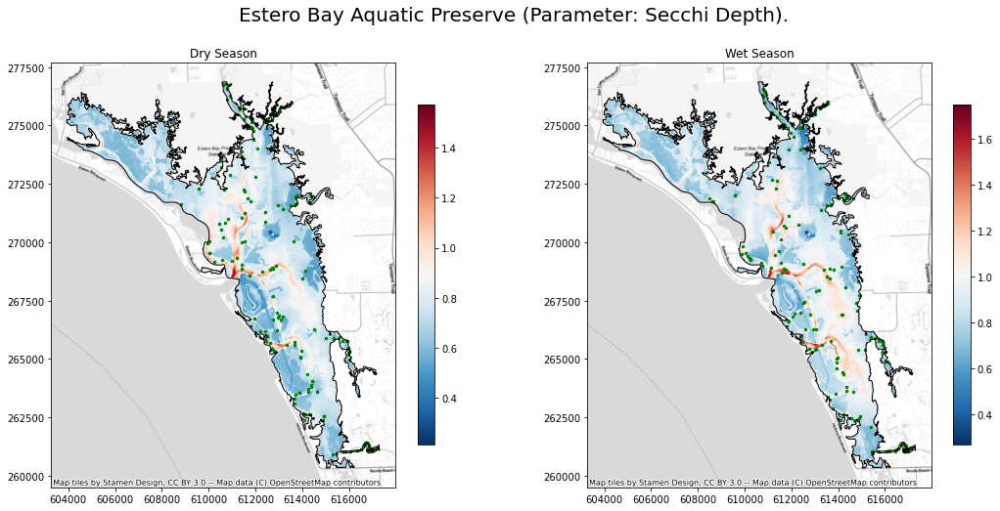

In [148]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.5.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="t_ldi_bathy_wf"></a>

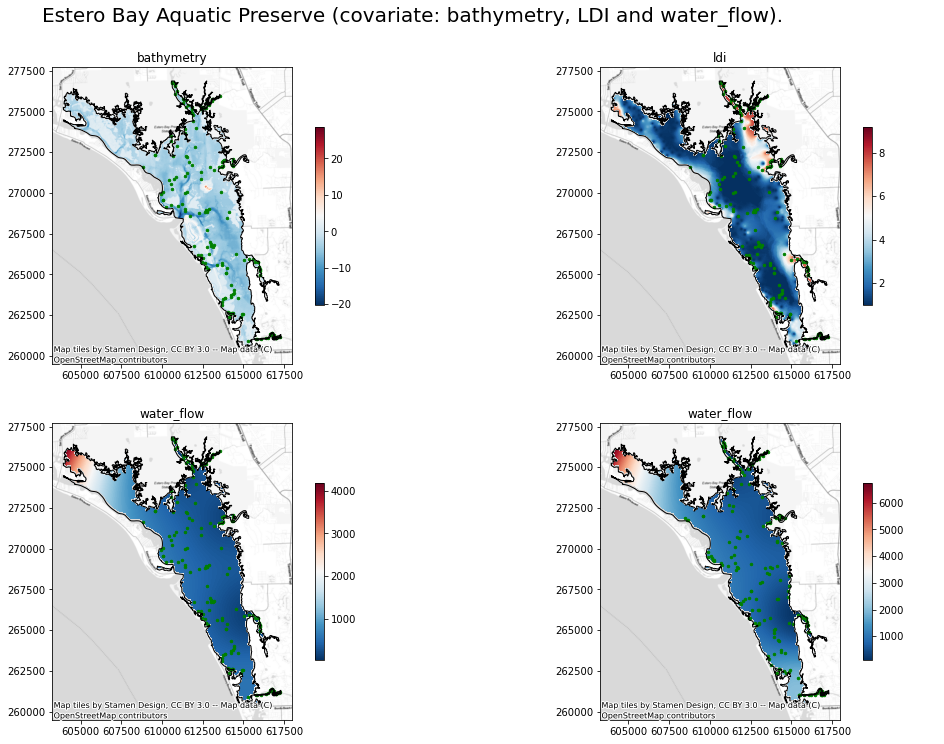

In [149]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [150]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 156.46343350410461 seconds ---
Start the interpolation with the RK method
--- Time lapse: 149.73986291885376 seconds ---


Plot interpolation results

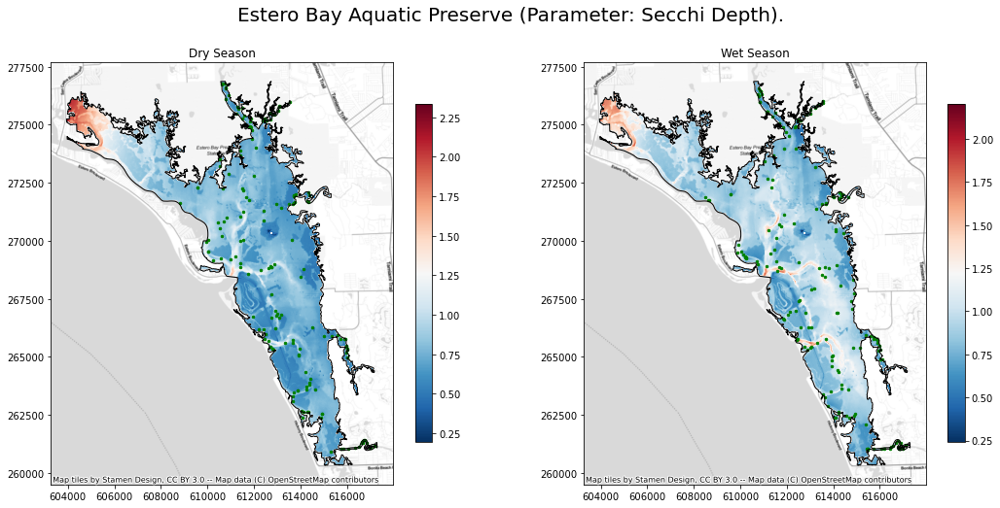

In [151]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.5.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="t_ldi_bathy_pd"></a>


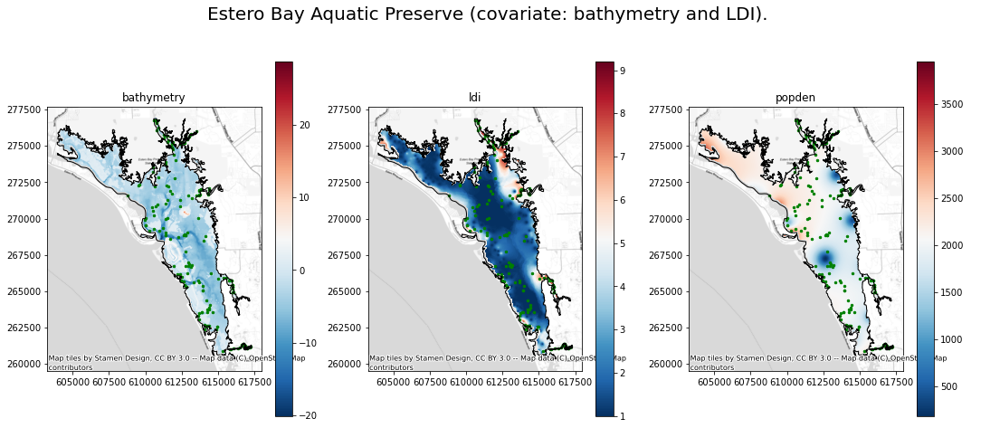

In [152]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [153]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 147.54194498062134 seconds ---
Start the interpolation with the RK method
--- Time lapse: 151.2631688117981 seconds ---


Plot interpolation results

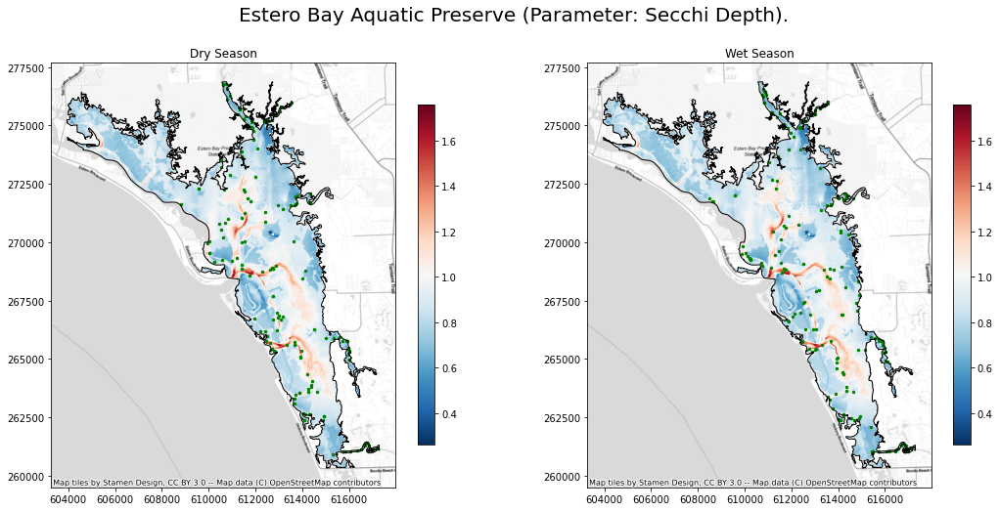

In [154]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.5.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="t_ldi_bathy_pd_wf"></a>


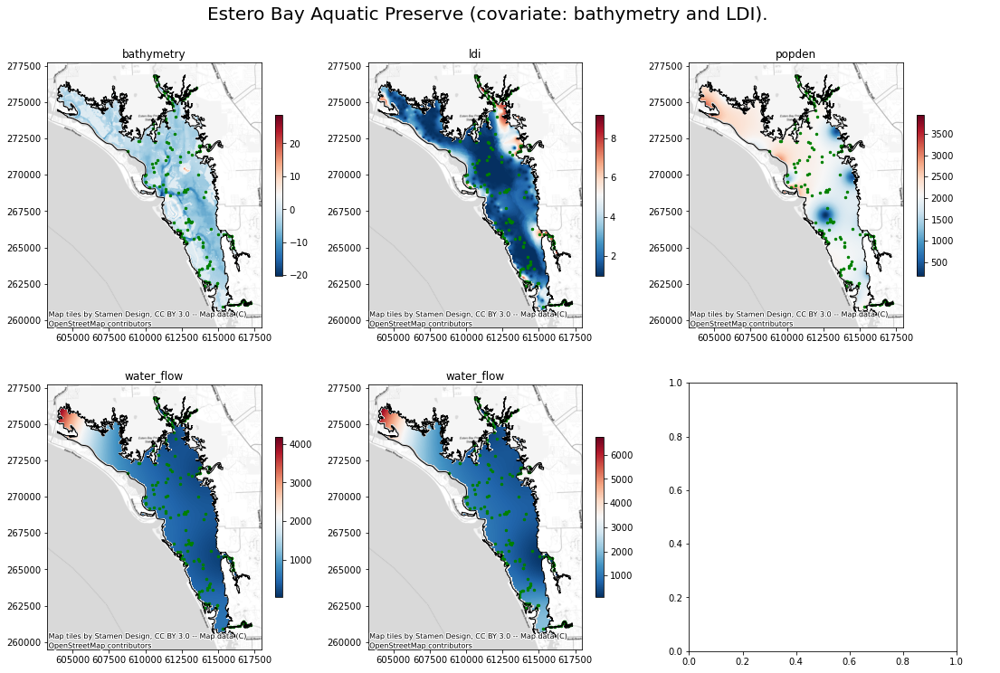

In [155]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [156]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 190.52557349205017 seconds ---
Start the interpolation with the RK method
--- Time lapse: 184.00107097625732 seconds ---


Plot interpolation results

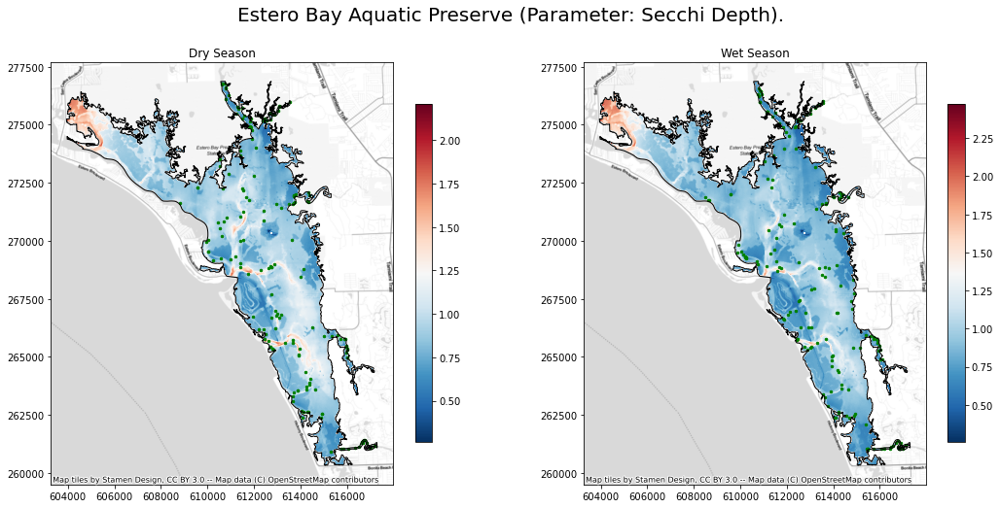

In [157]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.5.9 Validation Summary <a class="anchor" id="t_val_sum"></a>

In [158]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0000,-0.0068,0.2672
RK,0.0075,0.0225,0.3003
RK,0.0148,0.0471,0.3004
RK,0.0094,0.0283,0.2983
RK,-0.0034,-0.0194,0.2664
RK,-0.0064,-0.0283,0.2625
RK,-0.0034,0.0040,0.3553
RK,-0.0005,0.0089,0.3529


In [159]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.0024,0.0195,0.3645
RK,0.0044,0.0168,0.3805
RK,0.0064,0.0248,0.3836
RK,0.0018,0.0123,0.3821
RK,-0.0052,0.0020,0.3562
RK,-0.0017,0.0066,0.3551
RK,-0.0034,0.0040,0.3553
RK,-0.0019,0.0041,0.3540


## 3.6 Interpolation of Secchi Depth <a class="anchor" id="sd"></a>

Select data

In [187]:
year,Para,Para_ab = "2008", 'Secchi Depth', "SD"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\306329740.py:15: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_20968\306329740.py:16: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\ESRI\conda\envs\geo3\lib\site-packages\geopandas\io\file.py:545: UserWarning: You are attempting to write an empty DataFrame to file. For some drivers, this operation may fail.
  _to_file_fiona(df, filename, driver, schema, crs, mode, **kwargs)


Preview data

In [188]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [189]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

C:\Users\qiangy\AppData\Local\ESRI\conda\envs\geo3\lib\site-packages\geopandas\plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


Text(0.5, 1.0, 'Sampling points at Estero Bay Aquatic Preserve')

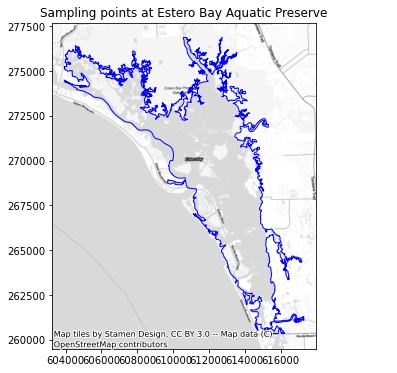

In [190]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.6.1 Regression Kriging of Turbidity (covariate: bathymetry) <a class="anchor" id="sd_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

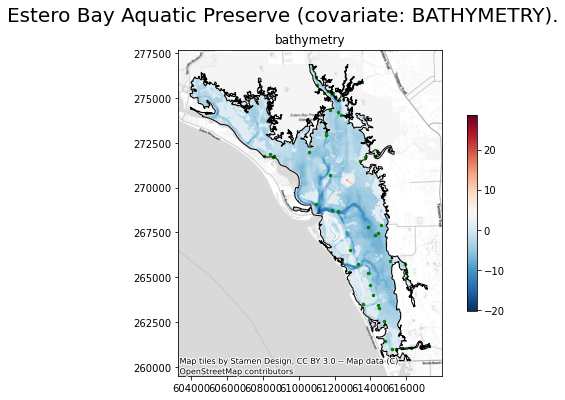

In [191]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [193]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 13.419708490371704 seconds ---
Start the interpolation with the RK method


ExecuteError: Failed to execute. Parameters are not valid.
ERROR 000366: Invalid geometry type
WARNING 000725: Output geostatistical layer: Dataset E:/Projects/SEACAR_WQ_Pilot/GIS_data/SDwetRK_bathy.lyrx already exists.
WARNING 000725: Output prediction raster: Dataset E:\Projects\SEACAR_WQ_Pilot\GIS_data\SDwetRK_bathy.tif already exists.
Failed to execute (EBKRegressionPrediction).


In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.6.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="sd_pd"></a>


RK interpolation

In [ ]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [ ]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Plot the interpolation result

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.6.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="sd_wf"></a>

RK interpolation

In [ ]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [ ]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Plot the interpolation result

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.6.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="sd_ldi_bathy"></a>


In [ ]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.6.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="sd_ldi_bathy_wf"></a>

In [ ]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.6.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="sd_ldi_bathy_pd"></a>


In [ ]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.6.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="sd_ldi_bathy_pd_wf"></a>


In [ ]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [ ]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Plot interpolation results

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.6.9 Validation Summary <a class="anchor" id="sd_val_sum"></a>

In [ ]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

In [ ]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1